## Importing Libraries

In [1]:
import pandas as pd
import glob
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import scipy.stats as stats
import pylab 
import warnings
warnings.filterwarnings('ignore')
from statsmodels.stats.stattools import durbin_watson
from sklearn.feature_selection import f_classif as fcl

In [2]:
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)

## Primary Data Exploration

### Data Preparation for a folder

In [3]:
# Define Path
rawdata_path=r'C:\Users\rishabh.saxena\Desktop\CaseStudy\Raw_data' #base directory
folder_name="VA00000000000017"
folder_path=os.path.join(rawdata_path,folder_name)

# Read all the CSVs into dataframe
globbed_files = glob.glob(os.path.join(folder_path,'*.csv')) # it will find all the csv and join with folder path and make it in list
device_csv_data=pd.DataFrame()
for csv in globbed_files:
    event_csv_data=pd.read_csv(csv)
    event_csv_data['filename']=os.path.basename(csv)
    device_csv_data=device_csv_data.append(event_csv_data)   
device_csv_data['filename'] = device_csv_data['filename'].str.replace('.csv','')

# Read all json into dataframe
globbed_files = glob.glob(os.path.join(folder_path,'*.json')) # it will find all the csv and join with folder path and make it in list
device_json_data=pd.DataFrame()
for json in globbed_files:
    event_json_data=pd.read_json(json)
    device_json_data=device_json_data.append(event_json_data)
device_json_data=device_json_data[device_json_data['Tags'].isin(['urination','defecation','non_elimination'])]

# Merge device csv data and device json data to get device full data
device_full_data=pd.merge(device_csv_data, device_json_data, left_on='filename', right_on='Event_ID', how='left').drop('filename', axis=1)

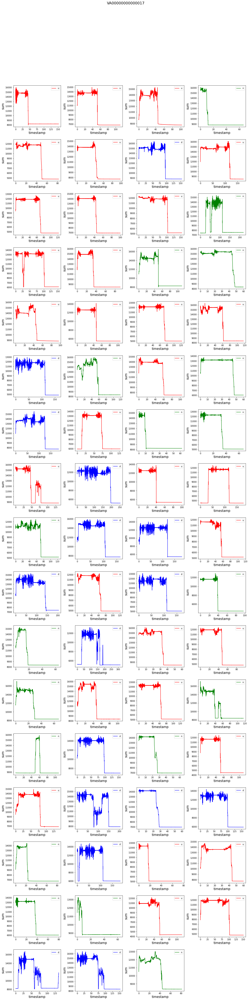

In [4]:
def device_data_line_plot(dataframe):
    plt.figure(figsize=(20, 80))
    plt.subplots_adjust(hspace=0.3,wspace=0.3)
    plt.suptitle(folder_name, fontsize=18, y=0.95)
    
    loE=dataframe['Event_ID'].unique()
    # loop through the list of Events(loE) and keep track of index
    for n, event in enumerate(loE):
        # add a new subplot iteratively
        ax = plt.subplot(17, 4, n + 1)
        ax.set_xlabel("timestamp", fontsize=15)
        ax.set_ylabel("sum", fontsize=15)
        
        df=dataframe[dataframe["Event_ID"] == event]
        if df["Tags"].unique() == 'urination':
            df.plot(x='timestamp', y='sum', c='red',ax=ax)
            plt.legend('urination')

        elif df["Tags"].unique() == 'defecation':
            df.plot(x='timestamp', y='sum', c='blue',ax=ax)
            plt.legend('defecation')

        else:
            df.plot(x='timestamp', y='sum', c='green',ax=ax)
            plt.legend('non-elimination')


# Plotting graphs for all the events of device          
device_data_line_plot(device_full_data)

### Observations

- It is observed that activity time for defecation is longer than urination and non elimination.
- It is evident that in case of defecation, fluctuations in load sensor values are higher as compared to urination and non-elimination. Standard Deviation will be a good feature to capture spread in data.
- In the plots corresponding to urination, we can see a common pattern having fluctuation, flat line, fluctuation, sudden drop(cat leaving the litter box). These patterns continue for a reasonable amount of time. 
- For defecation also pattern is same fluctuation, flat line, fluctuation, sudden drop, but in all these graphs time duration of flat line is less as compared to what we see in urination(rest time in case of urination is more).
- CSV is having data for longer time duration(even after activity is completed). We only need the data during cat's activity so we are eliminating all the other records(flat line after the dip).

### Capturing Activity part

In [5]:
def add_activity_time(df):
    min_sum=df['sum'].min()
    min_sum_5p=int(min_sum+0.05*min_sum)
    
    if df[df['sum']>=min_sum_5p].empty:
        end_time=round(float(df.tail(1).timestamp),2)  
    else:
        df=df[df['sum']>=min_sum_5p]
        end_time=round(float(df.tail(1).timestamp),2)

    df['activity_time'] = end_time
    return df

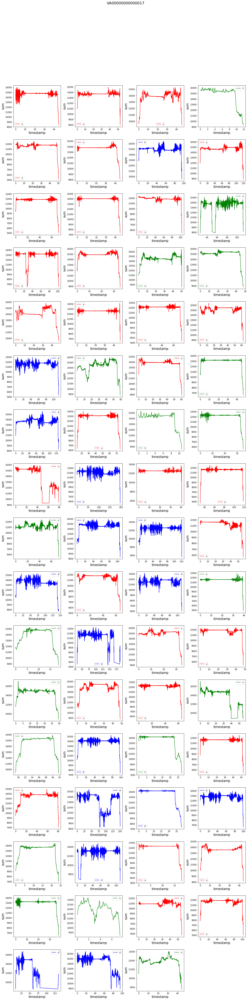

In [6]:
# Read all the CSVs into dataframe
globbed_files = glob.glob(os.path.join(folder_path,'*.csv')) # it will find all the csv and join with folder path and make it in list
device_csv_data=pd.DataFrame()
for csv in globbed_files:
    event_csv_data=pd.read_csv(csv)
    event_csv_data['filename']=os.path.basename(csv)
    event_csv_data=add_activity_time(event_csv_data)         # filtering the records corresponding to activity time   
    device_csv_data=device_csv_data.append(event_csv_data)   
device_csv_data['filename'] = device_csv_data['filename'].str.replace('.csv','')

# Read all the json into dataframe
globbed_files = glob.glob(os.path.join(folder_path,'*.json')) # it will find all the csv and join with folder path and make it in list
device_json_data=pd.DataFrame()
for json in globbed_files:
    event_json_data=pd.read_json(json)
    device_json_data=device_json_data.append(event_json_data)
device_json_data=device_json_data[device_json_data['Tags'].isin(['urination','defecation','non_elimination'])]

# Merge device csv data and device json data to get device activity full data
device_act_full_data=pd.merge(device_csv_data, device_json_data, left_on='filename', right_on='Event_ID', how='left').drop('filename', axis=1)

# Plotting graphs for all the events of device
device_data_line_plot(device_act_full_data)

## Path

In [32]:
input_path=r'C:\Users\rishabh.saxena\Desktop\CaseStudy\Raw_data' #base directory
output_path=r'C:\Users\rishabh.saxena\Desktop\CaseStudy\Final_clean_dataset.csv' #base directory
folders=os.listdir(input_path) # list of all folders inside base directory

## 1. Data Preparation & Feature Engineering

## 3.1 Perform data transformation/aggregation in time and frequency domain 

#### Taking median, mean load sensor values from csv data 

In [7]:
def csv_features_creation(df):    
    # Adding new column filename
    df['filename'] = os.path.basename(file) 
    df['filename'] = df['filename'].str.replace('.csv','')
    # Creating features such as median, mean and peak load sensor value
    df['median_lc0'] = df['lc0'].median()
    df['median_lc1'] = df['lc1'].median()
    df['median_lc2'] = df['lc2'].median()
    df['median_lc3'] = df['lc3'].median()
    df['median_load']= df['sum'].median()
    df['mean_load'] = round(df['sum'].mean(),2)
    df['std_load']=round(df['sum'].std(),2)
    # creating column event duration 
    df['event_duration'] = round(df['timestamp'].max(),2)
    return df

In [ ]:
## adding activity time features (mean activity load, peak activity load, minimum activity load, weight diifference)

In [8]:
def add_act_tm_features(df):
    # capturing mean, median and peak load sensor values during activity

    df['mean_act_tm_load'] = round(df['sum'].mean(),2)
    df['median_act_tm_load'] = df['sum'].median()        
    df['peak_act_tm_load'] = df['sum'].max()
    df['min_act_tm_load'] = df['sum'].min()
    df['std_act_tm_load'] = round(df['sum'].std(),2)
    df['w_diff'] = df['mean_act_tm_load']-df['min_act_tm_load']
    return df

In [ ]:
## Adding autocorrelation function at different lag values 

In [9]:
def acf_dw(df):   
    df['sum_lag_5']=df['sum'].shift(5)
    df['sum_lag_10']=df['sum'].shift(10)

    df['sum_lag_5']=df['sum_lag_5'].fillna(0)
    df['sum_lag_10']=df['sum_lag_10'].fillna(0)

    df['acf_sum_lag_1'] = durbin_watson(df['sum'])
    df['acf_sum_lag_5'] = durbin_watson(df['sum_lag_5'])
    df['acf_sum_lag_10'] = durbin_watson(df['sum_lag_10'])
    return df

In [ ]:
## Time binning the load sensor data at 4 intervals and creating features for each bin 

In [10]:
def time_bin_features(df):
    end_time=round(float(df.head(1).activity_time),3)
    b1_df=df[(df['timestamp']>=0) & (df['timestamp']<0.32*end_time)]
    b2_df=df[(df['timestamp']>=0.32*end_time) & (df['timestamp']<0.64*end_time)]
    b3_df=df[(df['timestamp']>=0.64*end_time) & (df['timestamp']<0.96*end_time)]
    b4_df=df[(df['timestamp']>=0.96*end_time) & (df['timestamp']<=end_time)]
    
    df['b1_mean_load'] = round(b1_df['sum'].mean(),2)
    df['b1_peak_load'] = b1_df['sum'].max()
    df['b1_min_load'] =  b1_df['sum'].min()
    df['b1_std_load'] =  round(b1_df['sum'].std(),2)
            
    df['b2_mean_load'] = round(b2_df['sum'].mean(),2)
    df['b2_peak_load'] = b2_df['sum'].max()
    df['b2_min_load'] =  b2_df['sum'].min()
    df['b2_std_load'] =  round(b2_df['sum'].std(),2)
            
    df['b3_mean_load'] = round(b3_df['sum'].mean(),2)
    df['b3_peak_load'] = b3_df['sum'].max()
    df['b3_min_load'] =  b3_df['sum'].min()
    df['b3_std_load'] =  round(b3_df['sum'].std(),2)
          
    df['b4_mean_load'] = round(b4_df['sum'].mean(),2)
    df['b4_peak_load'] = b4_df['sum'].max()
    df['b4_min_load'] =  b4_df['sum'].min()
    df['b4_std_load'] =  round(b4_df['sum'].std(),2)
    
    return df

In [ ]:
## Adding Energy and power features 

In [11]:
def add_power_energy(df):
    df['E0'] = sum((df['lc0']/max(abs(df['lc0'])))**2)
    df['E0']= round(df['E0'],2)
#     df['E0']=df['sq_lc0']/len(df['lc0'])
    
    df['E1'] = sum((df['lc1']/max(abs(df['lc1'])))**2)
    df['E1']= round(df['E1'],2)
#     df['E1']=df['sq_lc1']/len(df['lc1'])
    
    df['E2'] = sum((df['lc2']/max(abs(df['lc2'])))**2)
    df['E2']= round(df['E2'],2)
#     df['E2']=df['sq_lc2']/len(df['lc2'])
    
    df['E3'] = sum((df['lc3']/max(abs(df['lc3'])))**2)
    df['E3']= round(df['E3'],2)
#     df['E3']=df['sq_lc3']/len(df['lc3'])
    
    df['energy'] = df['E0']+df['E1']+df['E2']+df['E3']
    df['power'] = round((df['energy']/40),2)
    
    return df

#### Final data preparation by merging csv and json data

In [14]:
final_dataset=pd.DataFrame() #
for folder_name in folders: 
    folder_path=os.path.join(input_path,folder_name)
    
    all_files_names = os.listdir(folder_path) # list of all the files inside a folder
    unique_file_name=[filename[:-4] for filename in all_files_names if filename.endswith('.csv')]
    folder_data=pd.DataFrame() # It will contain all data of a folder 
    for file in unique_file_name: # it will go through all the files and append it folder_data

        file_path=os.path.join(folder_path,file)
        # Reading csv
        event_csv_data = pd.read_csv(file_path+'.csv')      
        
        # adding mean, median, std load senssor data for total duration    
        event_csv_data=csv_features_creation(event_csv_data)
        
        # finding activity time and filtering out excess data 
        event_csv_data=add_activity_time(event_csv_data) 
        
        # Adding mean, median, std of load sensor features during activity time 
        event_csv_data=add_act_tm_features(event_csv_data)
        
        # finding Durbin-Watson auto-correlation coeff.
        event_csv_data = acf_dw(event_csv_data)
        
        # Time binning and calculating statistical features
        event_csv_data = time_bin_features(event_csv_data)
        
        # Adding power and energy for time series data
        event_csv_data=add_power_energy(event_csv_data)
        
        # Reading json file        
        event_json_data = pd.read_json(file_path+'.json',lines=True) 
        
        # from Tags list filtering only urination, elimination and non-elimination activity 
        for i in event_json_data['Tags'].values.tolist()[0]: 
            if i in ['urination', 'defecation', 'non_elimination']:
                tag=i
        event_json_data['Tags']=tag
        event_json_data['Target'] = [0 if x =='non_elimination' else 1 for x in event_json_data['Tags']] # Elimination=1 and non_elimination=0      
        
        # joining an event's csv and json data 
        event_full_data=pd.merge(event_csv_data, event_json_data, left_on='filename', right_on='Event_ID', how='left').drop('filename', axis=1)
        
        # drop unnecessary columns and extracting only one row from whole data
        clmns_to_remove = ['t','lc0','lc1','lc2','lc3','sum','timestamp','Free_text','Tare_weight','sum_lag_5','sum_lag_10']
        event_full_data = event_full_data.drop(clmns_to_remove,axis=1).drop_duplicates(keep='first')
        
        folder_data = folder_data.append(event_full_data)
    
    final_dataset = final_dataset.append(folder_data)

In [16]:
final_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13075 entries, 0 to 0
Data columns (total 47 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   median_lc0          13075 non-null  float64
 1   median_lc1          13075 non-null  float64
 2   median_lc2          13075 non-null  float64
 3   median_lc3          13075 non-null  float64
 4   median_load         13075 non-null  float64
 5   mean_load           13075 non-null  float64
 6   std_load            13075 non-null  float64
 7   event_duration      13075 non-null  float64
 8   activity_time       13075 non-null  float64
 9   mean_act_tm_load    13075 non-null  float64
 10  median_act_tm_load  13075 non-null  float64
 11  peak_act_tm_load    13075 non-null  int64  
 12  min_act_tm_load     13075 non-null  int64  
 13  std_act_tm_load     13075 non-null  float64
 14  w_diff              13075 non-null  float64
 15  acf_sum_lag_1       13075 non-null  float64
 16  acf_sum_

In [17]:
final_dataset.head()

,median_lc0,median_lc1,median_lc2,median_lc3,median_load,mean_load,std_load,event_duration,activity_time,mean_act_tm_load,median_act_tm_load,peak_act_tm_load,min_act_tm_load,std_act_tm_load,w_diff,acf_sum_lag_1,acf_sum_lag_5,acf_sum_lag_10,b1_mean_load,b1_peak_load,b1_min_load,b1_std_load,b2_mean_load,b2_peak_load,b2_min_load,b2_std_load,b3_mean_load,b3_peak_load,b3_min_load,b3_std_load,b4_mean_load,b4_peak_load,b4_min_load,b4_std_load,E0,E1,E2,E3,energy,power,Device_ID,Event_ID,Event_start_time,Tags,Name_of_cat,Weight_of_cat,Target
0,2969.0,2430.0,4511.0,-1695.0,8214.0,10112.07,2961.45,151.97,44.77,14666.21,14791.0,16035,8382,643.39,6284.21,0.000190,0.000651,0.000652,14741.63,16035.0,12546.0,490.10,14795.17,14945.0,14635.0,30.28,14710.35,15621.0,13845.0,243.91,12663.38,14760.0,8626.0,1899.63,1326.06,953.25,1364.73,548.09,4192.13,104.80,VA00000000000017,RXZlbnRJbmZvcm1hdGlvbjo0OWQ4M2I3MS1kNDZmLTRiYjMtODJkYy1kMTE0MDg4OTBkOGQ=,2020-09-05 10:56:11-05:00,urination,Ryan,6589,1
0,3038.0,2699.0,3622.0,-2523.0,6825.0,10049.85,3453.25,111.97,52.72,13695.47,13727.0,14962,7956,436.35,5739.47,0.000066,0.000364,0.000359,13595.83,14479.0,11025.0,497.31,13733.87,14014.0,13362.0,36.89,13826.28,14962.0,13092.0,235.20,13204.76,14718.0,9496.0,1223.50,1533.85,433.01,1276.03,2095.43,5338.32,133.46,VA00000000000017,RXZlbnRJbmZvcm1hdGlvbjo0YmI3ZDc5YS0wNzMwLTQ0MTUtYjFmOC0xMDdlNWI0ODNhY2Y=,2020-07-18 14:41:37-05:00,urination,Ryan,6935,1
0,1434.0,4082.0,2966.0,395.0,8875.0,11050.50,2572.06,102.37,45.57,13853.92,13905.0,15311,9409,825.20,4444.92,0.000047,0.000316,0.000316,13600.05,14970.0,9631.0,1136.29,13900.58,14826.0,13240.0,206.80,14183.27,15311.0,12841.0,417.69,12942.84,15269.0,9791.0,1579.82,591.40,1261.93,751.53,368.94,2973.80,74.34,VA00000000000017,RXZlbnRJbmZvcm1hdGlvbjo0ZTBhMDVhOC0wZmI2LTQ2MGMtYmRiNC1jMWRlZGI5MmM3M2M=,2020-09-03 15:43:43-05:00,urination,Ryan,5139,1
0,2761.0,2589.0,2888.0,557.0,8795.0,9855.52,2384.83,66.37,11.82,14738.34,15417.0,16092,9332,1685.65,5406.34,0.000037,0.002361,0.002371,15657.03,16092.0,15112.0,182.08,15387.64,15945.0,15122.0,153.10,13768.72,15798.0,10858.0,1959.45,10219.05,11373.0,9511.0,681.74,392.35,276.18,211.86,256.70,1137.09,28.43,VA00000000000017,RXZlbnRJbmZvcm1hdGlvbjo1NGEwMTg2My01NDhjLTRhYTctYjA4YS01ZjZmMGUzNmZjMjc=,2020-09-01 12:02:05-05:00,non_elimination,Ryan,6983,0
0,2046.0,2808.0,3277.5,272.5,11513.5,8927.67,3379.64,82.37,50.27,11582.99,11766.0,12523,5170,778.89,6412.99,0.000040,0.000563,0.000563,11618.93,12416.0,10939.0,223.82,11765.01,12523.0,10687.0,220.20,11773.36,12290.0,11481.0,53.13,8378.44,11719.0,5321.0,1767.21,823.28,820.42,981.49,686.23,3311.42,82.79,VA00000000000017,RXZlbnRJbmZvcm1hdGlvbjo1YzQwMzE4MS1lNzhkLTQ3NzMtOWI2Zi02YzcwODkzMDU1NGQ=,2020-08-08 06:47:11-05:00,urination,Ryan,7017,1


## 1.1 Data Sufficiency Report:
- Data is sufficient for doing analysis and prediction. There are 2 data sources: CSV and Json.
- Data transformation is implemented on csv data.
- Final Data shape: (13075,46)
- Null values are handled using KNN imputer and outlier handling is done.

### 1.2 Decisions on data selection

- Every Folder is correspond to unique Device_ID and each device has multiple events(Event_IDs).
#### (a) From CSV Data
#### Features Extraction during event duration : median_lc0, median_lc1, median_lc2, median_lc3, mean_load, std_load, max_load, Power, Energy, Autocorrelation factor(at lag=1,5,10)
- In each event, There are multiple recordings of load sensor values so to extract one reading from csv data, median, Mean, standard deviation and Peak sensor values captured.
- Auto correlation coeff is calculated using Durbin-Watson formula. It indicates how well the timeseries data consistent.
- Power and Energy features are calculated using load sensor values (E= $\sum\limits_{n=1} ^n (lc)^2$)
#### Features Extraction during event duration:
- Activity time is time duration till there is sudden dip in load sensor value after that no fluctuation is captured.
- Features like Mean, standard deviation, peak and min value at each bin is calculated
####  (b) From Json data
#### Features Taken: Device_ID, Event_ID, Event_start_time, Tags, Weight_of_cat, Name_of_cat 

- Extracted Tags(Urination, defecation and non_elimination) and Target 

### 1.3 Decisions on merging the data, joining key

- In the device folder, each event has one csv and json file 
- Event_ID column is created in the csv file and json already has Event_ID as column
- Merging is done for event_csv and event_json file, Event_ID as joining key and left merge is done

###  1.4 Decisions on the target variable 

- In the final dataset, Tags column have target activities such as elimination(urination and defecation) and non-elimination
- Target column is derived from tags ('1': elimination and '0': non-elimination)
- Hence for Model 1 target variable is elimination(1) vs non-elimination(0) and for Model 2 target variable is Urination(0) vs defecation(1) 

In [18]:
final_dataset.describe()

,median_lc0,median_lc1,median_lc2,median_lc3,median_load,mean_load,std_load,event_duration,activity_time,mean_act_tm_load,median_act_tm_load,peak_act_tm_load,min_act_tm_load,std_act_tm_load,w_diff,acf_sum_lag_1,acf_sum_lag_5,acf_sum_lag_10,b1_mean_load,b1_peak_load,b1_min_load,b1_std_load,b2_mean_load,b2_peak_load,b2_min_load,b2_std_load,b3_mean_load,b3_peak_load,b3_min_load,b3_std_load,b4_mean_load,b4_peak_load,b4_min_load,b4_std_load,E0,E1,E2,E3,energy,power,Weight_of_cat,Target
count,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000,1.307500e+04,13073.000000,13068.000000,12908.000000,12908.000000,12908.000000,12903.000000,13001.000000,13001.000000,13001.000000,12999.000000,13053.000000,13053.000000,13053.000000,13052.000000,13048.000000,13048.000000,13048.000000,13008.000000,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000
mean,2702.278126,2500.512275,2724.610019,2788.381568,11567.159388,11579.258402,2059.911938,112.911857,71.766461,13422.147155,13567.202180,15126.910669,9585.628757,742.597984,3836.518398,1.394911e-04,0.001067,0.001020,13514.384549,14483.983808,11673.502092,481.459936,13576.095163,14326.977925,12674.525806,261.691556,13280.140223,14185.825251,12149.125948,352.647109,12165.289926,13503.698191,9910.371321,907.833999,1244.957671,1164.783340,1232.323592,1218.539976,4860.604579,121.515102,4808.845889,0.682753
std,2016.274170,1671.275751,1967.078015,1877.323444,4178.374084,3656.722538,577.480679,58.472137,54.202610,3730.056283,3814.303283,3775.458159,3687.651983,545.597511,1176.045227,9.752480e-04,0.005927,0.004331,3621.256535,3669.072332,3842.013930,469.943686,3767.050483,3740.678179,3956.666042,454.926125,3949.996735,4036.086179,4027.614913,474.524449,3988.532365,4360.849775,3761.723875,594.040247,1045.624931,956.151574,1027.505403,1007.386972,3446.438137,86.160903,999.232091,0.465422
min,-3226.000000,-1838.000000,-4242.000000,-2862.000000,-771.000000,-532.110000,3.180000,3.980000,0.080000,-532.110000,-771.000000,141.000000,-24848.000000,3.180000,4.420000,4.564782e-08,0.000041,0.000041,-225.320000,141.000000,-24848.000000,2.820000,-770.360000,-766.000000,-1790.000000,0.750000,-1717.660000,-771.000000,-1782.000000,0.140000,-1733.940000,-1733.000000,-1735.000000,0.000000,2.790000,2.870000,2.710000,2.030000,10.400000,0.260000,0.000000,0.000000
25%,1319.000000,1340.500000,1481.000000,1574.000000,8764.500000,9159.640000,1698.470000,74.370000,34.920000,11019.425000,11169.000000,12528.000000,7291.000000,374.365000,3180.090000,3.174459e-05,0.000284,0.000283,11134.680000,11961.000000,9269.000000,128.660000,11179.650000,11865.000000,10247.000000,61.840000,10885.370000,11719.000000,9672.000000,104.650000,9634.635000,10903.000000,7505.750000,420.297500,515.160000,492.480000,504.780000,511.065000,2514.675000,62.870000,4177.000000,0.000000
50%,2514.500000,2438.000000,2771.500000,2722.000000,11383.000000,11331.530000,2066.150000,105.930000,58.480000,13251.820000,13437.000000,14920.000000,9416.000000,566.530000,3832.610000,5.998393e-05,0.000442,0.000442,13246.390000,14233.500000,11398.000000,286.390000,13420.570000,14164.000000,12498.000000,112.820000,13246.830000,14186.000000,11993.000000,164.950000,12071.455000,13569.500000,9767.000000,928.295000,996.230000,935.620000,983.850000,986.170000,4131.660000,103.290000,4651.000000,1.000000
75%,3987.000000,3591.000000,4105.500000,3892.500000,14384.000000,13660.045000,2461.040000,140.805000,96.740000,15550.600000,15735.000000,17325.000000,11508.500000,933.495000,4619.925000,1.097749e-04,0.000756,0.000755,15563.732500,16630.250000,14052.000000,729.975000,15726.480000,16442.000000,15101.000000,184.675000,15611.750000,16558.000000,14681.000000,336.065000,14515.520000,16169.000000,11983.000000,1343.930000,1653.390000,1571.780000,1652.460000,1636.765000,6403.125000,160.075000,5500.000000,1.00

# 2. Data exploration and Hypothesis Validation

### 2.1 Explore the support and time duration of activities

- Using line plot, cat activities analyzed for each folder(ex. folder VA17 folder results are shown).
- These plots are plotted using function device_data_line_plot.
- Red: Urination, Blue: Defecation and Green: Non-elimination activity.

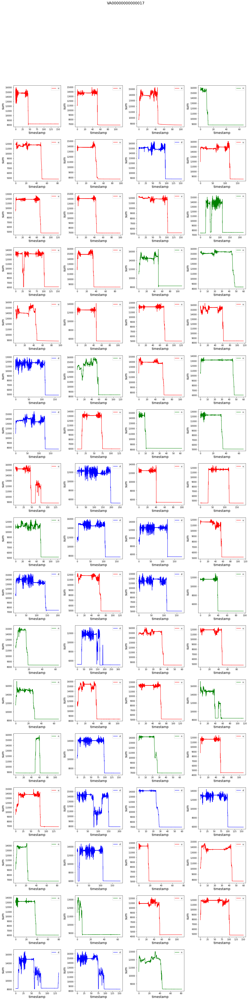

#### Observations:
- It is observed that activity time for defecation is longer than urination and non elimination.
- It is evident that in case of defecation, fluctuations in load sensor values are higher as compared to urination and non-elimination. Standard Deviation will be a good feature to capture spread in data.
- In the plots corresponding to urination, we can see a common pattern having fluctuation, flat line, fluctuation, sudden drop(cat leaving the litter box). These patterns continue for a reasonable amount of time. 
- For defecation also pattern is same fluctuation, flat line, fluctuation, sudden drop, but in all these graphs time duration of flat line is less as compared to what we see in urination(rest time in case of urination is more).
- CSV is having data for longer time duration(even after activity is completed). We only need the data during cat's activity so we are eliminating all the other records(flat line after the dip).

In [19]:
# final_dataset['Event_start_time'] = final_dataset['Event_start_time'].dt.tz_localize(None)
final_dataset['Event_start_time'] = pd.to_datetime(final_dataset['Event_start_time'],utc=True)

In [20]:
final_dataset['Day_Part'] = (final_dataset['Event_start_time'].dt.hour + 4) // 4
final_dataset['Day_Part'].replace({1: 'Late Night',2: 'Early Morning',3: 'Morning',4: 'Noon',5: 'Evening',6: 'Night'},inplace=True)

In [21]:
final_df=final_dataset.drop(['Device_ID','Event_ID','Event_start_time'],axis=1)

### 2.4 Data Preprocessing 

In [22]:
final_dataset.isnull().sum()

median_lc0              0
median_lc1              0
median_lc2              0
median_lc3              0
median_load             0
mean_load               0
std_load                0
event_duration          0
activity_time           0
mean_act_tm_load        0
median_act_tm_load      0
peak_act_tm_load        0
min_act_tm_load         0
std_act_tm_load         0
w_diff                  0
acf_sum_lag_1           0
acf_sum_lag_5           2
acf_sum_lag_10          7
b1_mean_load          167
b1_peak_load          167
b1_min_load           167
b1_std_load           172
b2_mean_load           74
b2_peak_load           74
b2_min_load            74
b2_std_load            76
b3_mean_load           22
b3_peak_load           22
b3_min_load            22
b3_std_load            23
b4_mean_load           27
b4_peak_load           27
b4_min_load            27
b4_std_load            67
E0                      0
E1                      0
E2                      0
E3                      0
energy      

#### KNN imputer is used to identify and replace missing values for given columns
- A multivariate approach for imputation
- a point value can be approximated by the values of the points that are closest, based on other variables.

In [23]:
clms_to_knn=list(set(final_df.columns) - {'Tags','Day_Part','Name_of_cat'})

In [24]:
from sklearn.impute import KNNImputer
impute_knn = KNNImputer(n_neighbors=5,weights='uniform', metric='nan_euclidean')
final_df[clms_to_knn]=impute_knn.fit_transform(final_df[clms_to_knn])

In [25]:
final_df[clms_to_knn].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13075 entries, 0 to 0
Data columns (total 42 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   b4_min_load         13075 non-null  float64
 1   min_act_tm_load     13075 non-null  float64
 2   b2_min_load         13075 non-null  float64
 3   std_load            13075 non-null  float64
 4   b3_peak_load        13075 non-null  float64
 5   power               13075 non-null  float64
 6   Target              13075 non-null  float64
 7   E1                  13075 non-null  float64
 8   median_lc3          13075 non-null  float64
 9   b4_peak_load        13075 non-null  float64
 10  b1_std_load         13075 non-null  float64
 11  median_lc0          13075 non-null  float64
 12  median_lc1          13075 non-null  float64
 13  peak_act_tm_load    13075 non-null  float64
 14  b2_std_load         13075 non-null  float64
 15  E2                  13075 non-null  float64
 16  median_l

### Outlier Handling

In [26]:
def plotvariable(data,variable):
    plt.figure(figsize=(5,5))
    #histogram
    plt.subplot(1,2,1)
    plt.hist(data[variable],alpha=0.5)
    #boxplot
    plt.subplot(1,2,2)
    sns.boxplot(data[variable])
    plt.show()

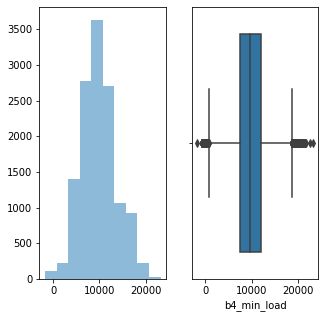

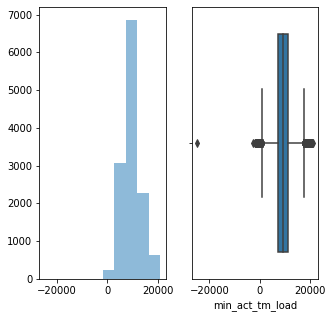

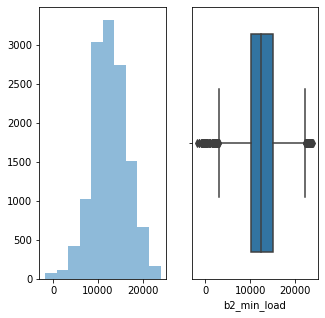

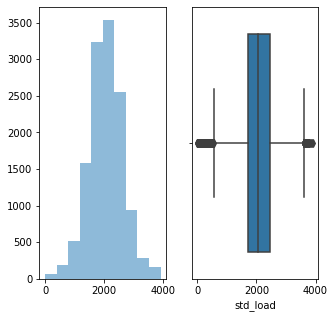

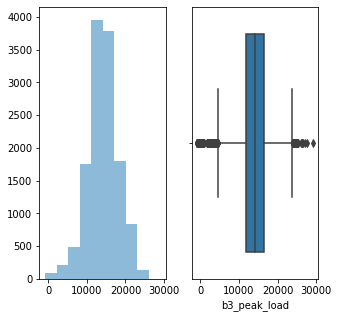

...

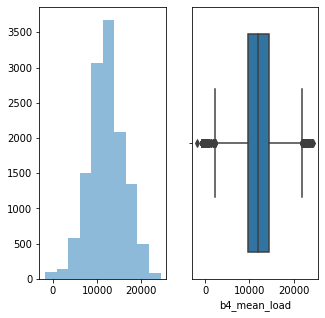

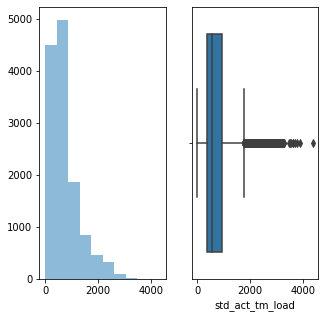

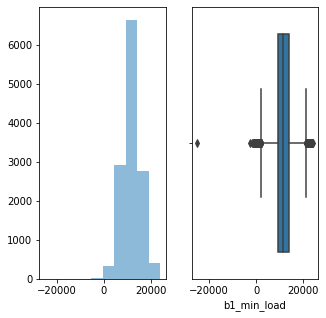

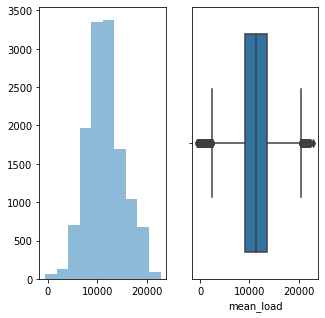

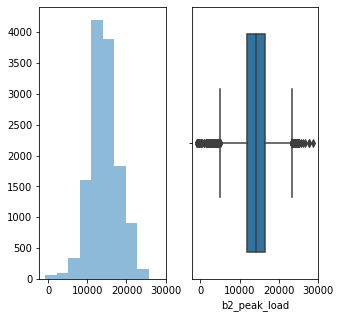

In [27]:
columns=list(set(final_df.columns) - {'Tags', 'Name_of_cat', 'Target','Day_Part'})
for column in columns:
    plotvariable(final_df, column)

#### Observation
- As we can notice that following data is skewed hence we will perform IQR method and transformation techinques to handle the data distribution
- Skewed Data(right): b4_std_load, b2_std_load, E0, energy, E2, E1, b3_std_load, E3, b1_std_load
- IQR transformation Flooring and capping: b1_min_load, min_act_tm_load, w_diff, Weight of cat

#### Detecting the outlier using IQR and implementing flooring and capping for variables(b1_min_load, min_act_tm_load, w_diff, Weight of cat). 

In [28]:
def floor_cap_outlier(df,variable):
    Q1 = df[variable].quantile(0.10)
    Q3 = df[variable].quantile(0.90)
    IQR = Q3 - Q1
    whisker_width = 1.5
    lower_limit = Q1 -(whisker_width*IQR)
    upper_limit = Q3 +(whisker_width*IQR)
    df[variable]=np.where(df[variable]>upper_limit,upper_limit,np.where(df[variable]<lower_limit,lower_limit,df[variable]))
    return df[variable]

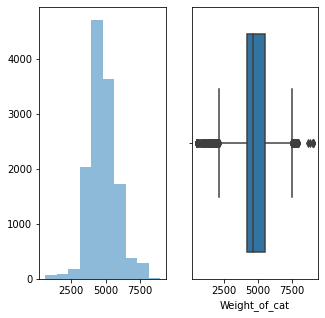

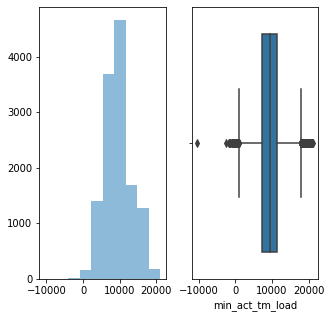

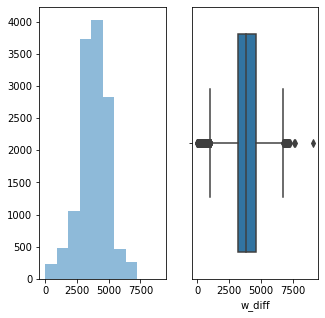

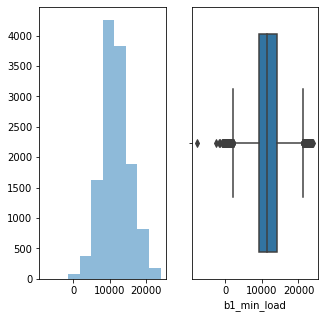

In [29]:
features=['Weight_of_cat','min_act_tm_load','w_diff','b1_min_load']
for feature in features:
    final_df[feature]=floor_cap_outlier(final_df,feature)
    plotvariable(final_df,feature)

#### Transformations(sqrt transformation)

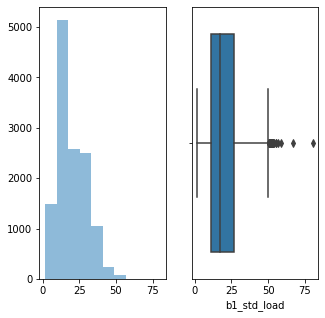

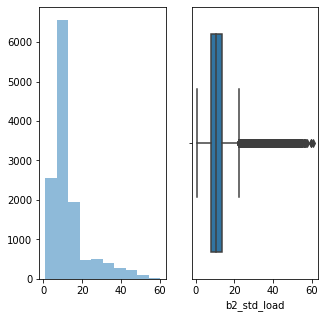

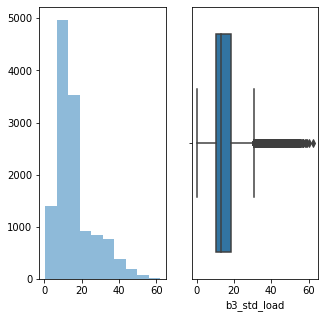

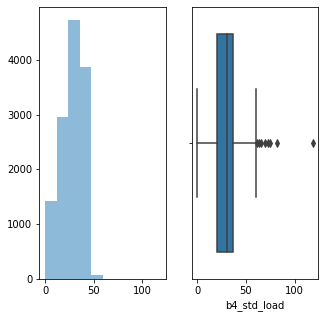

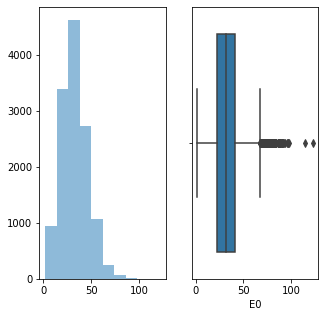

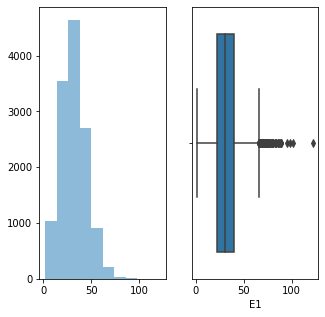

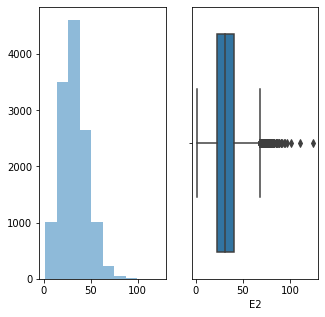

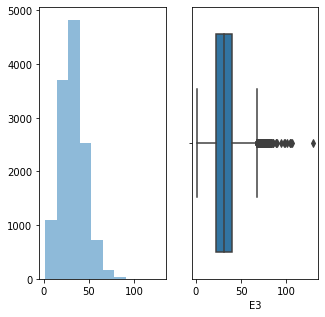

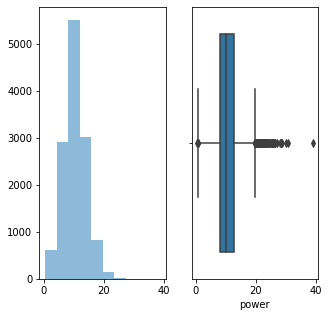

In [30]:
features=['b1_std_load', 'b2_std_load', 'b3_std_load', 'b4_std_load', 'E0', 'E1', 'E2', 'E3', 'power']
for feature in features:
    final_df[feature] = np.sqrt(final_df[feature])
    plotvariable(final_df,feature) 

In [33]:
final_df.to_csv(path_or_buf=output_path)

In [6]:
final_df=pd.read_csv('Final_clean_dataset.csv')

In [14]:
final_df=final_df.drop('Unnamed: 0',axis=1)

# 

##  Exploratory Data Analysis(EDA)

In [15]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13075 entries, 0 to 13074
Data columns (total 45 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   median_lc0          13075 non-null  float64
 1   median_lc1          13075 non-null  float64
 2   median_lc2          13075 non-null  float64
 3   median_lc3          13075 non-null  float64
 4   median_load         13075 non-null  float64
 5   mean_load           13075 non-null  float64
 6   std_load            13075 non-null  float64
 7   event_duration      13075 non-null  float64
 8   activity_time       13075 non-null  float64
 9   mean_act_tm_load    13075 non-null  float64
 10  median_act_tm_load  13075 non-null  float64
 11  peak_act_tm_load    13075 non-null  float64
 12  min_act_tm_load     13075 non-null  float64
 13  std_act_tm_load     13075 non-null  float64
 14  w_diff              13075 non-null  float64
 15  acf_sum_lag_1       13075 non-null  float64
 16  acf_

### Univariate Analysis

In [179]:
sns.set(rc={'figure.figsize':(7,7)})

In [36]:
df_univariate=final_df.drop(['Tags','Day_Part','Name_of_cat'],axis=1)
clms_to_eda=df_univariate.columns
df_pair=final_df[clms_to_eda]

In [37]:
df_elimi=df_pair.loc[df_pair['Target']==1]
df_non_elimi=df_pair.loc[df_pair['Target']==0]

In [38]:
def univariate_eli_vs_non_eli(feature):
    plt.figure(figsize=(6,3))
    plt.plot(df_elimi[feature],np.zeros_like(df_elimi[feature]),'o',label = 'elimination')
    plt.plot(df_non_elimi[feature],np.zeros_like(df_non_elimi[feature]),'v',label = 'non-elimination')

    plt.xlabel(feature)
    plt.legend()
    plt.show()

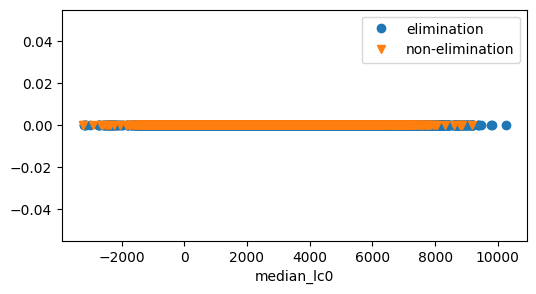

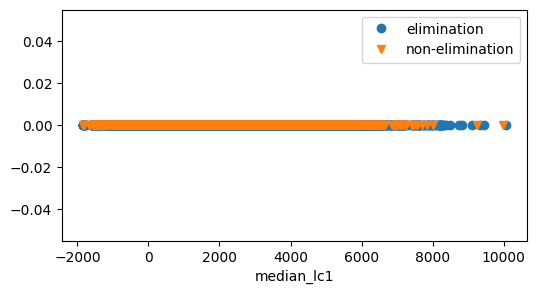

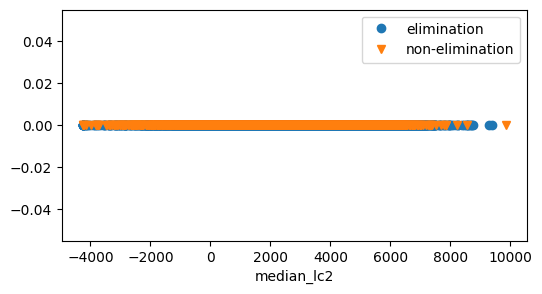

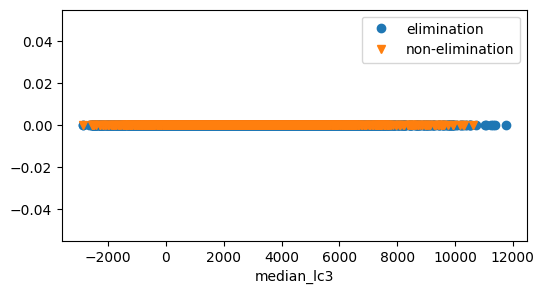

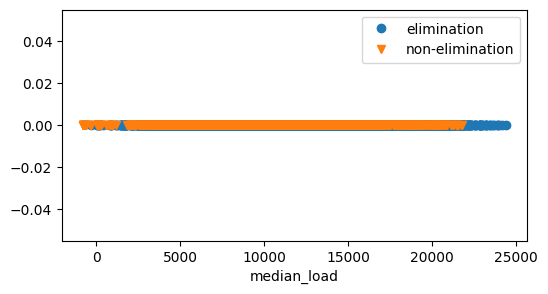

...

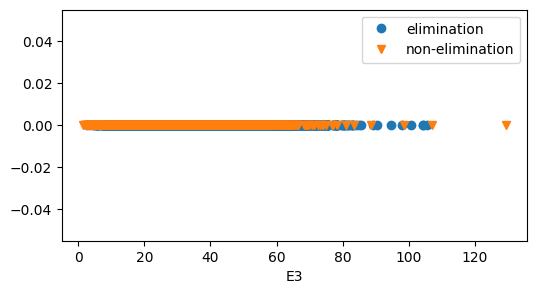

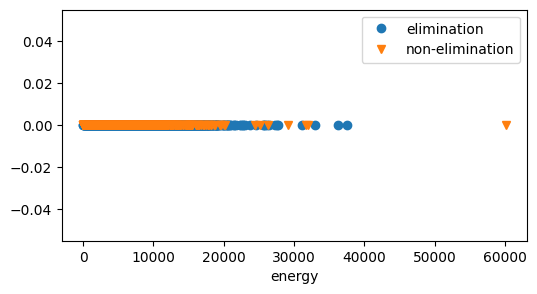

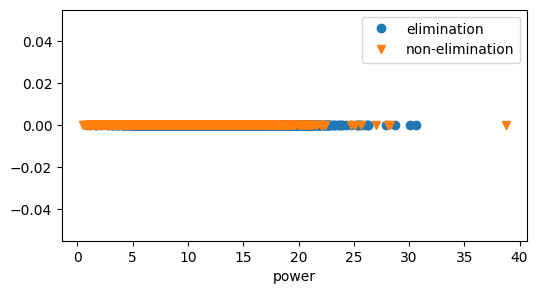

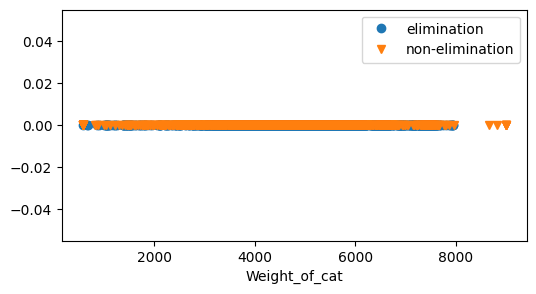

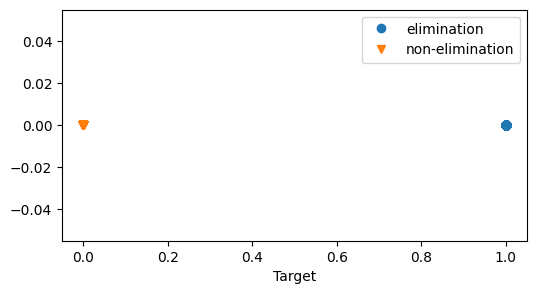

In [39]:
for column in clms_to_eda:
    univariate_eli_vs_non_eli(column)

#### Observation:
- load sensor values for elimination activity(approximately 25000 gm) higher than non-elimionation(approximately 22000gm)
- event duration for elimination activity(approximately 500sec) is higher in comparison to non-elimination(approximately 350sec)

<AxesSubplot: xlabel='Tags', ylabel='count'>

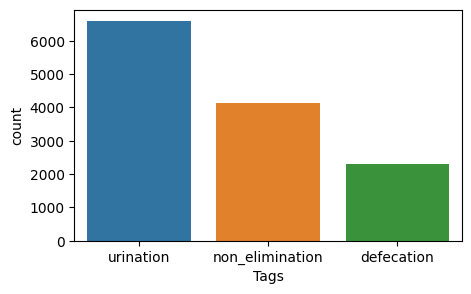

In [40]:
plt.figure(figsize=(5,3))
sns.countplot(x ='Tags', data = final_df)

### 2.1(cont.) Explored the support vs time during Cat events

In [41]:
def scatterplot_bins(data):
    plt.figure(figsize=(15,12))
    
    columns=['b1_mean_load','b2_mean_load','b3_mean_load','b4_mean_load','mean_act_tm_load','mean_load']
    for i, column in enumerate(columns):
        plt.subplot(3, 2, i+1)
        sns.scatterplot('activity_time',column,hue='Tags',style='Target',markers=['o','X',],data=final_df)

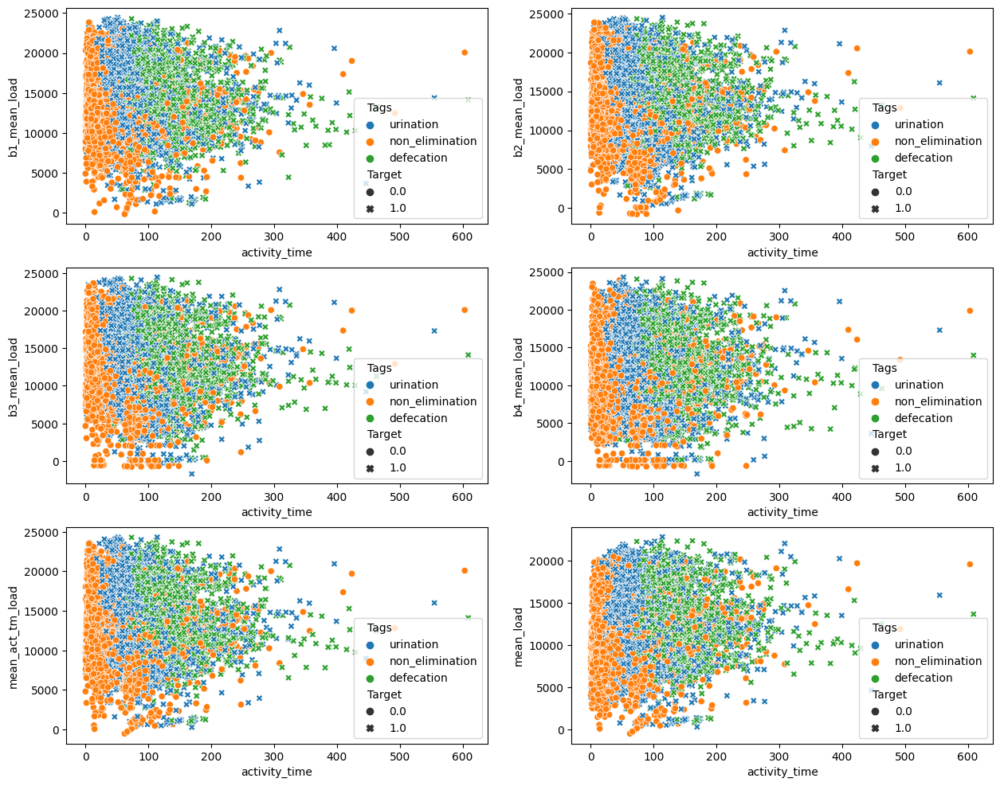

In [42]:
scatterplot_bins(final_df)

In [ ]:
# H0: During digging up and covering activity load sensor values and activity time will not change between urination and non-elimination
# H1: During digging up and covering activity load sensor values and activity time will not change between urination and non-elimination

In [23]:
np.random.seed(12)
Mean_load=stats.poisson.rvs(loc=18,mu=30,size=60)
Mean_load.mean()

47.75

In [26]:
t,p_value=stats.ttest_ind(a=final_df['activity_time'],b=final_df['mean_load'],equal_var=False)
print(p_value)
if p_value < 0.05:    # alpha value is 0.05 or 5%
    print(" we are rejecting null hypothesis")
else:
    print("we are accepting null hypothesis")

0.0
 we are rejecting null hypothesis


In [43]:
final_df.groupby(['Tags'])['b1_mean_load','b2_mean_load','b3_mean_load','b4_mean_load','activity_time'].agg(['mean','std'])

b1_mean_load               b2_mean_load               \
                         mean          std          mean          std   
Tags                                                                    
defecation       13845.953098  3533.506447  13980.469594  3570.396545   
non_elimination  12772.245178  3488.289716  12911.886232  3719.596903   
urination        13861.728740  3668.180586  13839.447997  3810.666510   

                 b3_mean_load               b4_mean_load               \
                         mean          std          mean          std   
Tags                                                                    
defecation       13698.204559  3779.022847  12962.320336  3886.899999   
non_elimination  12661.234658  3914.580001  11241.016223  3907.529820   
urination        13515.935303  3985.835301  12451.174100  3974.114059   

                activity_time             
                         mean        std  
Tags                                      
defecation         125.268087  55.778618  
non_elimination     46.117126  48.342035  
urination           69.116889  42.805904

In [ ]:
## 2.3 Describe and understand the activities’ behaviour 

In [ ]:
### Observation
- During elimination activities mean of load sensor values are higher than non-elimination
- During elimination activities mean of activity time is higher than non-elimination

### Hypothesis Testing

In [ ]:
# H0: Mean of load sensor values is similar in each activity
# H1: Mean of load sensor values is not similar in each activity

In [46]:
df_anova = final_df[['mean_load','Tags']]
tags = pd.unique(df_anova['Tags'].values)
mean_load = {tag:df_anova['mean_load'][df_anova['Tags'] == tag] for tag in tags}
F, p = stats.f_oneway(mean_load['urination'], mean_load['defecation'], mean_load['non_elimination'])
print(p)
if p<0.05:
    print("reject null hypothesis")
else:
    print("accept null hypothesis")

1.8809527463959334e-56
reject null hypothesis


- Hence during elimination activities mean of load sensor values are higher than non-elimination

In [81]:
def bins_std(data):
    plt.figure(figsize=(12,12))
    
    columns=['b1_std_load','b2_std_load','b3_std_load','b4_std_load','std_act_tm_load']
    for i, column in enumerate(columns):
        plt.subplot(3, 2, i+1)
        sns.barplot('Tags', column, data=final_df)

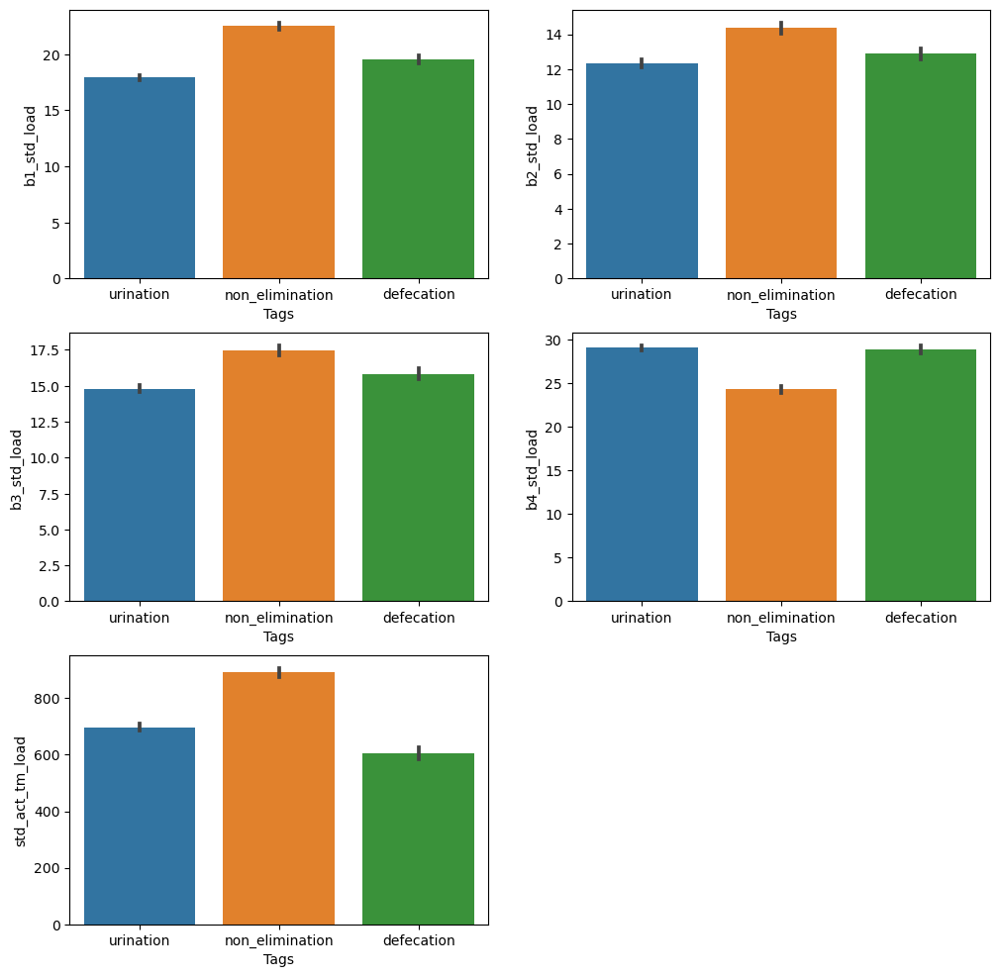

In [82]:
bins_std(final_df)

### Observations:
- for Bin 4, magnitude of std is higher than other bins.  
- Except for bin 4 std for non-elimination activity is higher than elimination activity.  

In [90]:
def scatterplot_median(data):
    plt.figure(figsize=(15,12))
    
    columns=['median_lc0','median_lc1','median_lc2','median_lc3','median_load']
    for i, column in enumerate(columns):
        plt.subplot(3, 2, i+1)
        sns.scatterplot('event_duration',column,hue='Tags',style='Target',markers=['o','X',],data=final_df)

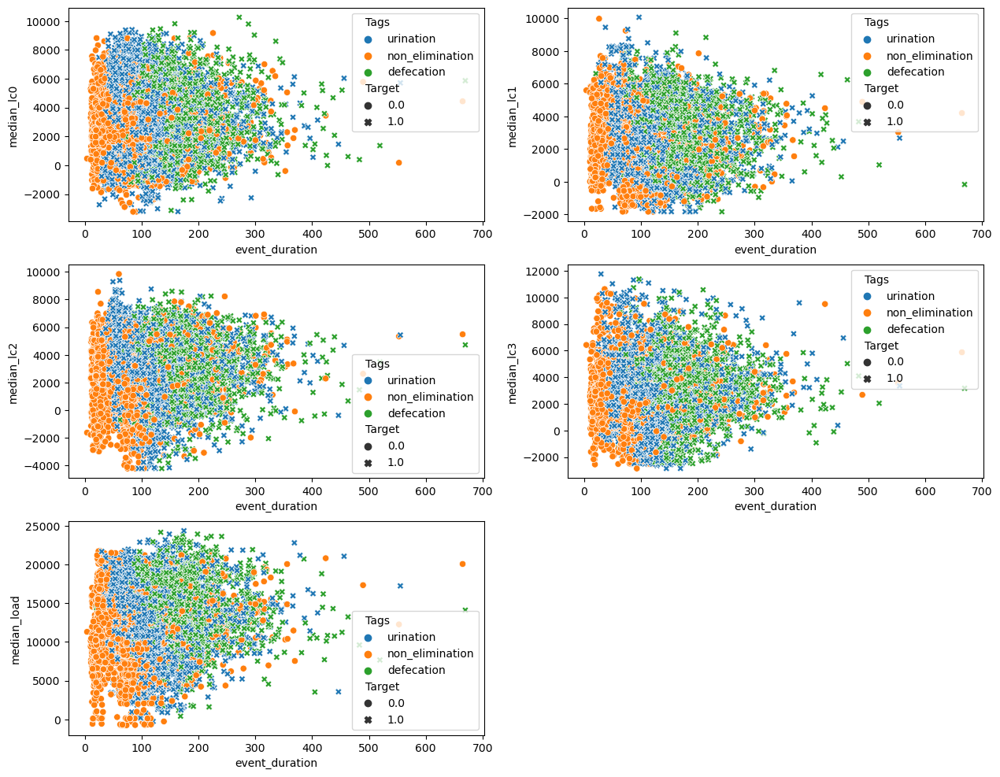

In [91]:
scatterplot_median(final_df)

In [92]:
final_df.groupby(['Tags'])['median_lc0','median_lc1','median_lc2','median_lc3','median_load'].agg(['mean','std'])

median_lc0                median_lc1               \
                        mean          std         mean          std   
Tags                                                                  
defecation       2871.357297  2011.896643  2849.592832  1686.312363   
non_elimination  2539.327507  1880.312390  2348.654894  1591.852553   
urination        2745.287022  2092.036567  2473.501815  1697.358650   

                  median_lc2                median_lc3               \
                        mean          std         mean          std   
Tags                                                                  
defecation       3091.427461  1966.287897  3109.968696  1947.142927   
non_elimination  2412.867888  1946.860766  2740.785198  1799.469033   
urination        2791.703827  1951.580435  2705.585312  1888.642117   

                  median_load               
                         mean          std  
Tags                                        
defecation       13359.285190  3764.350263  
non_elimination  10587.031823  3919.656616  
urination        11554.302904  4266.370327

#### Observation:
- Mean of load sensor values in case of non-elimination activity is less than elimination.
- From Scatter plot it is clear that non_elimination activities at the bottom which means less time is consumed during this activity and at the top defaction activity.
- lc2 sensor data is showing more negative readings(median_lc2 vs event duration) 

### 2.2 Explored the Mean and Std support values vs activity duration during Cat events

### Relationship of load sensors during Elimination and Non-elimination activity 

In [47]:
def boxplot_mean_max(data):
    plt.figure(figsize=(15,8))
    
    columns=['b1_mean_load','b2_mean_load','b3_mean_load','b4_mean_load']
    for i, column in enumerate(columns):
        plt.subplot(2, 2, i+1)
        sns.boxplot('Tags',column,data=final_df)

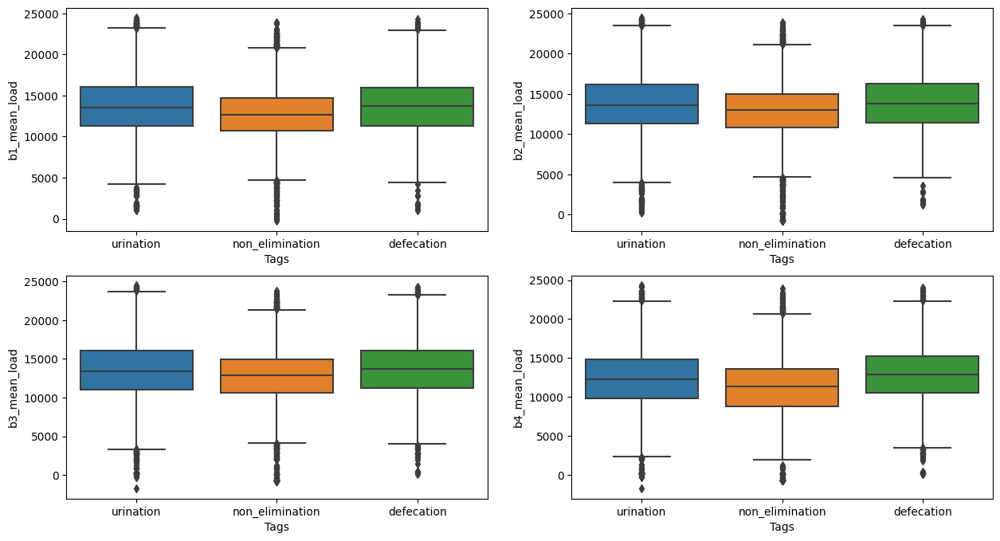

In [48]:
boxplot_mean_max(final_df)

- It is evident that mean of load sensor value is less during non-elimination activity

In [49]:
def boxplot_bins_std(data):
    plt.figure(figsize=(15,8))
    
    columns=['b1_std_load','b2_std_load','b3_std_load','b4_std_load']
    for i, column in enumerate(columns):
        plt.subplot(2, 2, i+1)
        sns.boxplot('Tags',column,data=final_df)

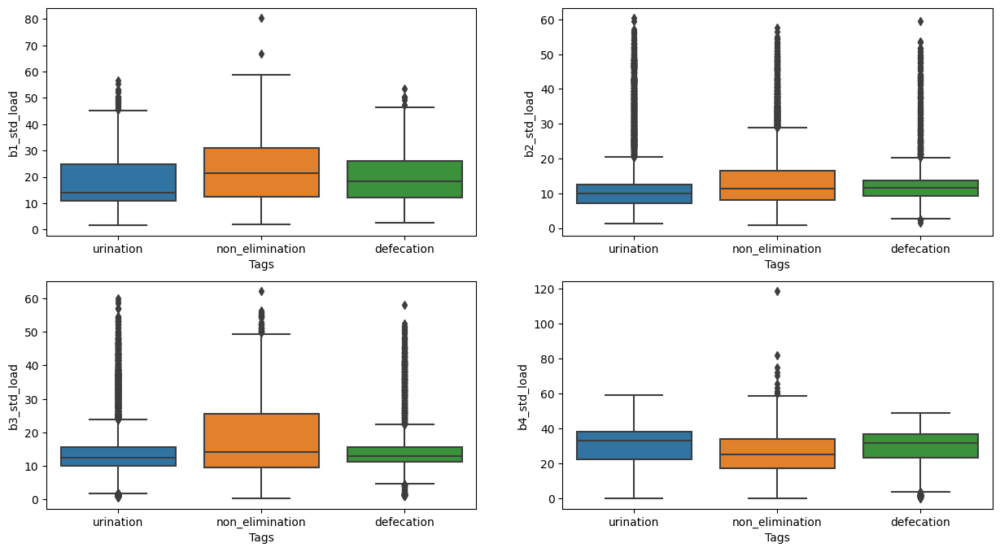

In [50]:
boxplot_bins_std(final_df)

### Relationship of time duration during Elimination and Non-elimination activity 

<AxesSubplot: xlabel='Tags', ylabel='event_duration'>

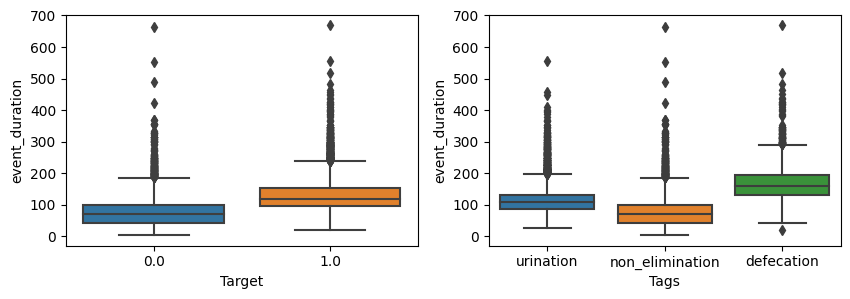

In [51]:
plt.figure(figsize=(10,3))

plt.subplot(1,2,1)
sns.boxplot('Target','event_duration',data=final_df)
plt.subplot(1,2,2)
sns.boxplot('Tags','event_duration',data=final_df)

<AxesSubplot: xlabel='Tags', ylabel='activity_time'>

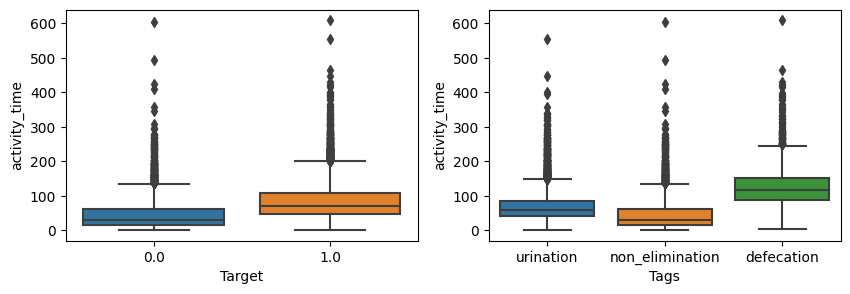

In [52]:
plt.figure(figsize=(10,3))

plt.subplot(1,2,1)
sns.boxplot('Target','activity_time',data=final_df)
plt.subplot(1,2,2)
sns.boxplot('Tags','activity_time',data=final_df)

In [28]:
final_df.groupby(['Tags'])['activity_time','event_duration'].agg(['mean','std'])

activity_time            event_duration           
                         mean        std           mean        std
Tags                                                              
defecation         125.268087  55.778618     168.674650  56.364374
non_elimination     46.117126  48.342035      80.347910  53.744484
urination           69.116889  42.805904     113.808639  45.627751

#### Observations:
- event duration for elimination is higher than non_elimination
- for defecation activity, event duration and is maximum.

#### Note:
- similar to event duration, activity time is also maximum for defecation activity while lowest for non elimination 

### Hypothesis Testing

In [53]:
# H0: event duration for elimination is not higher than non_elimination
# H1: event duration for elimination is higher than non_elimination

df_anova = final_df[['event_duration','Tags']]
tags = pd.unique(df_anova['Tags'].values)
event_duration = {tag:df_anova['event_duration'][df_anova['Tags'] == tag] for tag in tags}
F, p = stats.f_oneway(event_duration['urination'], event_duration['defecation'], event_duration['non_elimination'])
print(p)
if p<0.05:
    print("reject null hypothesis")
else:
    print("accept null hypothesis")

0.0
reject null hypothesis


- Hence event duration for elimination is higher than non_eliminationn

In [54]:
def boxplot_acf(data):
    plt.figure(figsize=(18,4))
    
    columns=['acf_sum_lag_1','acf_sum_lag_5','acf_sum_lag_10']
    for i, column in enumerate(columns):
        plt.subplot(1, 3, i+1)
        sns.barplot('Tags',column,data=final_df)

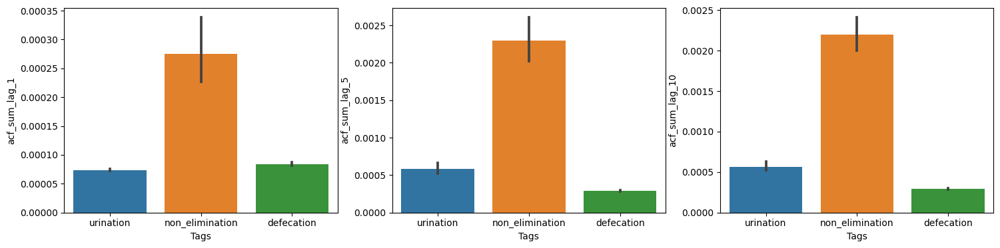

In [55]:
boxplot_acf(final_df)

<AxesSubplot: xlabel='activity_time', ylabel='power'>

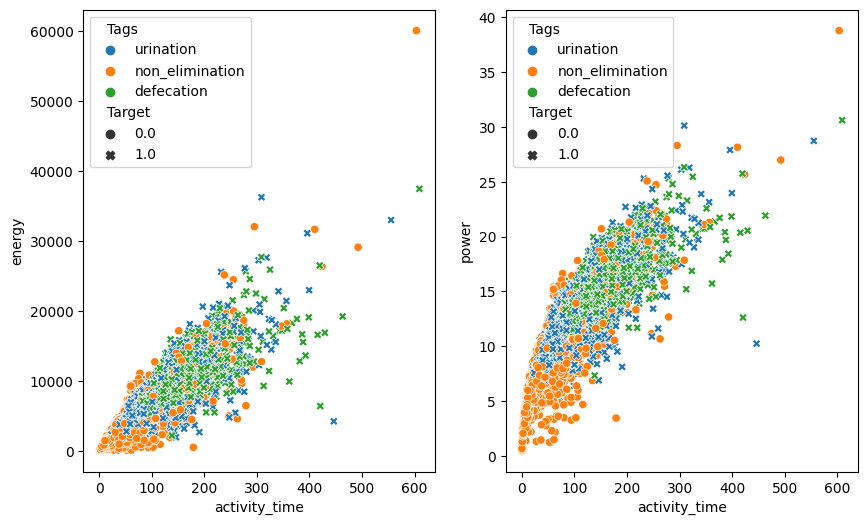

In [57]:
plt.figure(figsize=(10,6))

plt.subplot(1,2,1)
sns.scatterplot('activity_time','energy',hue='Tags',style='Target',markers=['o','X',],data=final_df)
plt.subplot(1,2,2)
sns.scatterplot('activity_time','power',hue='Tags',style='Target',markers=['o','X',],data=final_df)

In [30]:
final_df.groupby(['Tags'])['energy','power'].agg(['mean','max'])

energy                power           
                        mean       max       mean        max
Tags                                                        
defecation       8176.867936  37453.25  14.028133  30.599510
non_elimination  3106.490509  60095.86   7.973697  38.760805
urination        4799.433686  36261.94  10.598591  30.108969

#### Observation:
- Energy and power features are positive correlated with activity time 
- Energy and power are higher for elimination activities.

### Hypothesis Testing

In [58]:
# H0: Energy and power are not higher for elimination activities.
# H1: Energy and power are higher for elimination activities.

df_anova = final_df[['power','Tags']]
tags = pd.unique(df_anova['Tags'].values)
power = {tag:df_anova['power'][df_anova['Tags'] == tag] for tag in tags}
F, p = stats.f_oneway(power['urination'], power['defecation'], power['non_elimination'])
print(p)
if p<0.05:
    print("reject null hypothesis")
else:
    print("accept null hypothesis")

0.0
reject null hypothesis


- Energy and power are higher for elimination activities.

<AxesSubplot: xlabel='Tags', ylabel='w_diff'>

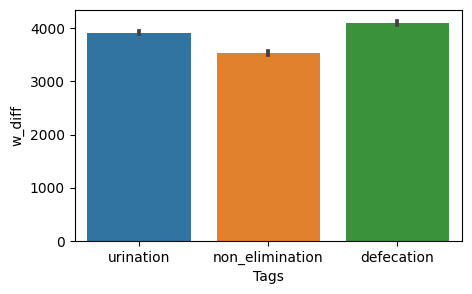

In [62]:
plt.figure(figsize=(5,3))
sns.barplot('Tags','w_diff',data=final_df)

### Observations:
- W_diff is lesser during non-elimination activity and highest for defecation 

## 3.2 Behaviour pattern of each cat

- from raw sensor data, it is observed that each cat is showing different patterns of activities.
### Relationship between cat and behaviour pattern

In [63]:
final_dataset['Name_of_cat'].nunique()

51

<AxesSubplot: >

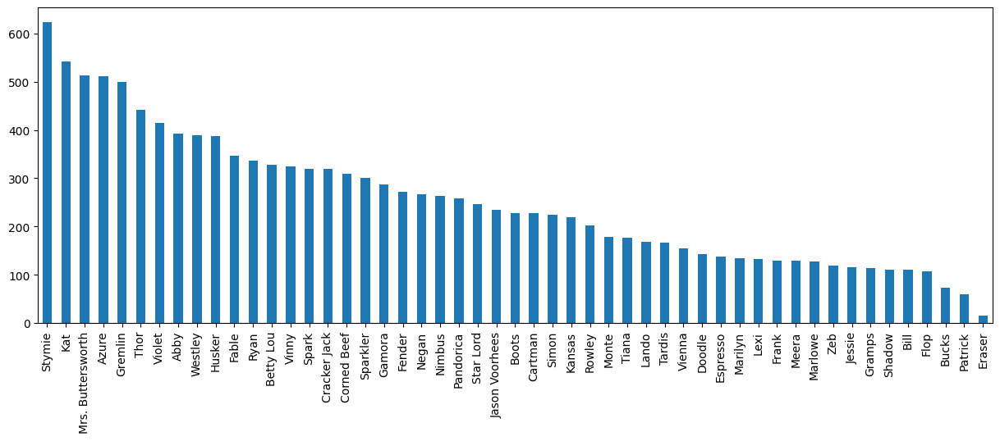

In [64]:
plt.figure(figsize=(15,5))
final_df['Name_of_cat'].value_counts().plot(kind='bar')

<AxesSubplot: xlabel='Name_of_cat'>

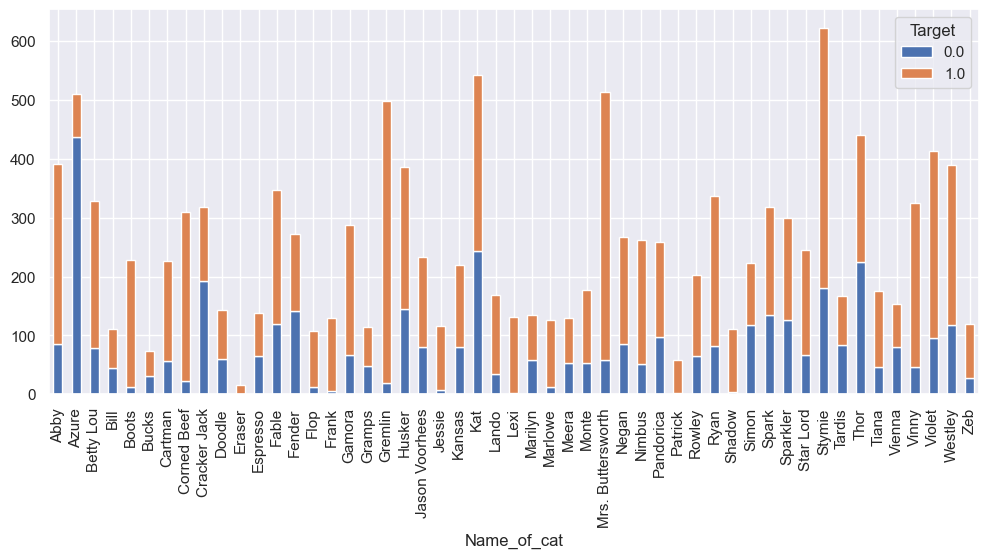

In [65]:
sns.set(rc={'figure.figsize':(12,5)})
final_df.groupby(['Name_of_cat', 'Target'])['Name_of_cat'].count().unstack().plot(kind='bar',stacked=True)

<AxesSubplot: xlabel='Name_of_cat'>

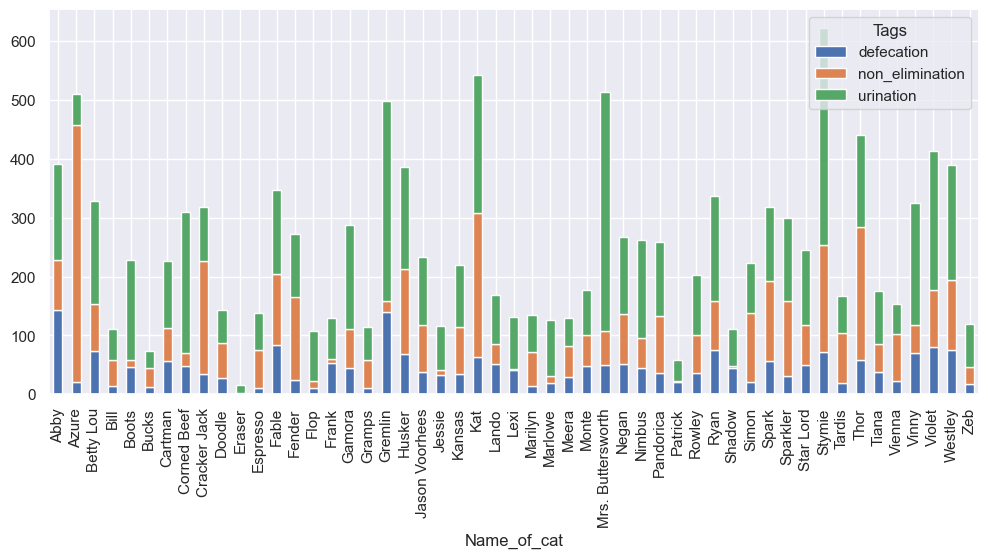

In [66]:
final_df.groupby(['Name_of_cat', 'Tags'])['Name_of_cat'].count().unstack().plot(kind='bar', stacked=True)

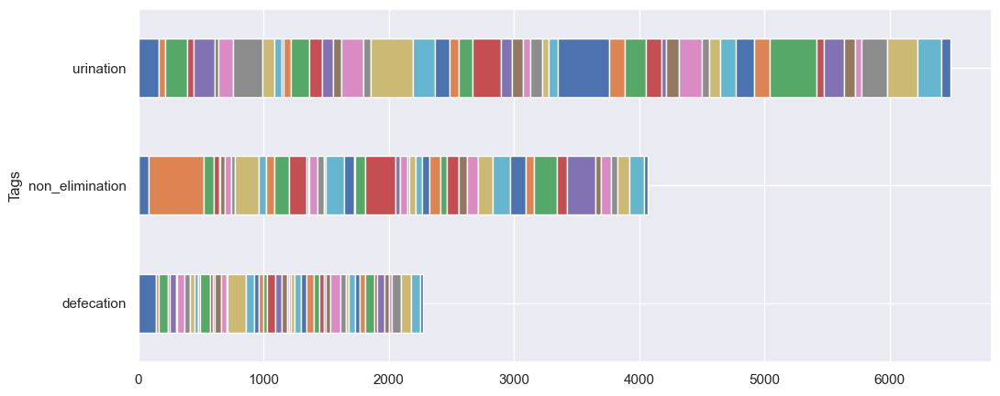

In [67]:
final_df[['Name_of_cat','Tags']].value_counts().unstack(0).plot(kind='barh',stacked=True)
plt.gca().get_legend().remove()

#### Observation:
- There are total 51 cats 
- Urination is most common activity among cats, followed by non-elimination and defecation.

<AxesSubplot:xlabel='Day_Part'>

<Figure size 300x300 with 0 Axes>

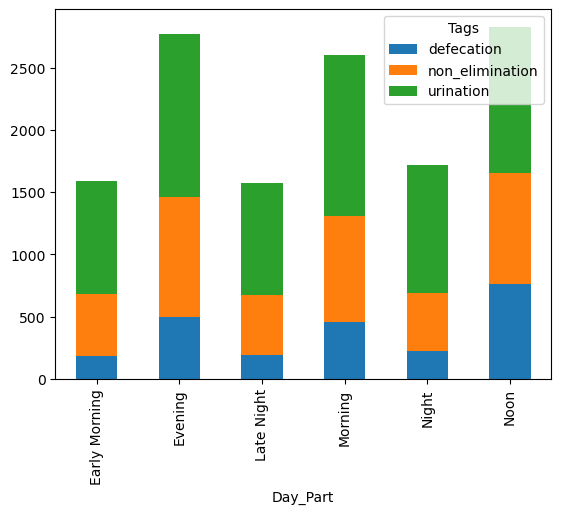

In [140]:
sns.reset_defaults()
final_df.groupby(['Day_Part', 'Tags'])['Day_Part'].count().unstack().plot(kind='bar', stacked=True)

### 3.3 Summary of the patterns for each activity


- from data exploration, it is observed that load sensor values are showing fluctuation, rest, fluctuation and after that sudden dip.
- For defecation activity magnitude of fluctuation is more than other two(urination and non-elimination).
- For Urination activity, resting time between the fluctuation is greater than other two(defecation and non-elimination)
- from scatter plot between bin mean load sensor values during elimination activities mean of load sensor values are higher than non-elimination.
- During elimination activities mean of activity time is higher than non-elimination.
- for Bin 4, magnitude of std is higher than other bins.  
- From Scatter plot between load sensor value and time, it is clear that non_elimination activities at the bottom which means less time is consumed during this activity and at the top defaction activity.
- lc2 sensor data is showing more negative readings(median_lc2 vs event duration).
- from boxplot between event duration and tags, event duration for elimination activities is higher than non_elimination activity.
- activity time is also maximum for defecation activity while lowest for non elimination activity
- Energy and power are higher for elimination activities.
- 51 unique cat data is recorded in which 'Stymie' is appeared maximum time.
- Urination activity is most common activity among the cats.
- In day part during early morning and morning time cats are having maximum activity.

In [31]:
model_df=final_df.drop(['Name_of_cat','Tags','Day_Part'],axis=1)
data=model_df.corr()

<AxesSubplot: >

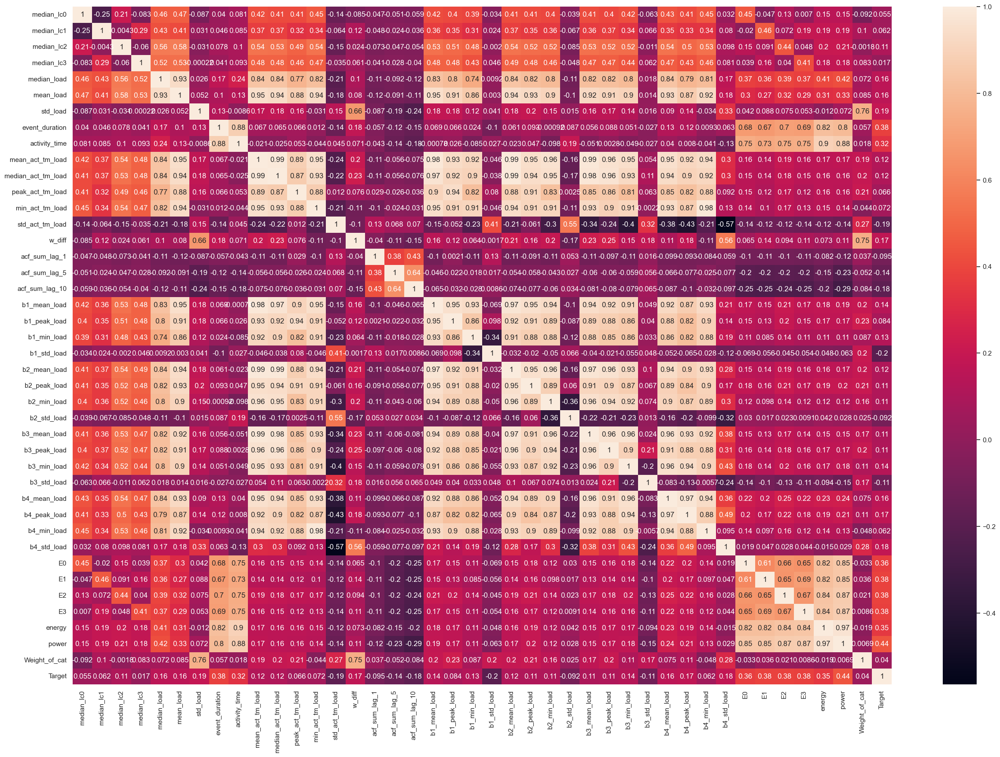

In [69]:
sns.set(rc={'figure.figsize':(30,20)})
sns.heatmap(data,annot=True)

#### Observation
- Power, event duration, activity duration and energy(E0-E4) are showing strong correlation with Target.
- b1_std_load, acf_sum_lag_10 and std_act_tm_load are negatively correlated with Target. 
- mean sum, median_sum, mean_activity_sum, median_activity_sum, median_lc0, median_lc1, median_lc2, median_lc3 are are heavily correlated with each other.
- peak sum and peak_activity_sum are heavily correlated.
- power, mean_sum and median_sum are heavily correlated.
- Power and energy are showing strong correlation.

## 4. Feature Selection and Model Building

### F-Test

In [72]:
X=model_df.drop('Target',axis=1)
y=model_df['Target']

In [74]:
result=fcl(X,y)
f_score=result[0]
p_value=result[1]
f_scores=pd.DataFrame(result[0],columns=["f_Score"])
p_values=pd.DataFrame(result[1],columns=["p_value"])
df_columns=pd.DataFrame(X.columns)
features_rank=pd.concat([df_columns,f_scores,p_values],axis=1)
features_rank['p1']=features_rank['p_value'].round(4)
features_rank.sort_values(by=['f_Score'],ascending=False)

,0,f_Score,p_value,p1
39,power,3113.774447,0.000000e+00,0.0000
36,E2,2256.132689,0.000000e+00,0.0000
35,E1,2250.622120,0.000000e+00,0.0000
7,event_duration,2201.446027,0.000000e+00,0.0000
37,E3,2159.661412,0.000000e+00,0.0000
34,E0,2002.309537,0.000000e+00,0.0000
38,energy,1789.037633,0.000000e+00,0.0000
8,activity_time,1518.357146,2.571888e-314,0.0000
21,b1_std_load,536.798777,2.042630e-116,0.0000
6,std_load,488.374692,2.807332e-106,0.0000


In [32]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from mlxtend.evaluate import bias_variance_decomp
from sklearn.metrics import zero_one_loss
from sklearn.model_selection import GridSearchCV
import shap
shap.initjs()

### Model_1: Train model to predict the elimination and non-elimination activity

### 4.2 Feature selection Criterion:
- From EDA results, Event duration, Activity time, Power, energy, w_diff, b1_std_load,b2_std_load, b3_std_load, b4_std_load are shown good results with target
- F test is used as feature selection technique which gives importance to features based on statistical parameter.
- From Correlation heat map best features are selected(having coeff >0.3). 
- If the features are not showing strong correlation(in this case >0.2) with target variable and showing high multicollinearity then it is dropped.

In [33]:
features=['event_duration','activity_time','power','energy','E0','E1','E2','E3',
          'b1_std_load','b2_std_load','b3_std_load','b4_std_load','b4_peak_load',
          'b1_mean_load','b2_mean_load','b3_mean_load','b4_mean_load','w_diff','b1_min_load',
          'b3_min_load','std_act_tm_load','acf_sum_lag_5','acf_sum_lag_10','mean_load','Target']

In [34]:
model_dataset=final_df[features]

In [35]:
model_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13075 entries, 0 to 13074
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   event_duration   13075 non-null  float64
 1   activity_time    13075 non-null  float64
 2   power            13075 non-null  float64
 3   energy           13075 non-null  float64
 4   E0               13075 non-null  float64
 5   E1               13075 non-null  float64
 6   E2               13075 non-null  float64
 7   E3               13075 non-null  float64
 8   b1_std_load      13075 non-null  float64
 9   b2_std_load      13075 non-null  float64
 10  b3_std_load      13075 non-null  float64
 11  b4_std_load      13075 non-null  float64
 12  b4_peak_load     13075 non-null  float64
 13  b1_mean_load     13075 non-null  float64
 14  b2_mean_load     13075 non-null  float64
 15  b3_mean_load     13075 non-null  float64
 16  b4_mean_load     13075 non-null  float64
 17  w_diff      

## 4.3 Model Building(LR, DT and RF)
- Model Performance using Evaluation Matrix
- Cross validation score, Bias and Variance comparison
- Hyperparameter Tuning

#### Logistic Regression

In [36]:
X=model_dataset.drop('Target',axis=1)
y=model_dataset['Target']

In [37]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30,random_state=101)

In [38]:
model_logi = LogisticRegression(random_state=101, penalty="l2", C=5)
model_logi.fit(X_train,y_train)
## prediction
y_train_pred= model_logi.predict(X_train)
y_test_pred=model_logi.predict(X_test)

    
print(confusion_matrix(y_test,y_test_pred))
print('-'*50)

print(classification_report(y_test, y_test_pred))
print('-'*50)

def performance(X_train,y_train, X_test,y_test):
    
    print('Train accuracy_score',accuracy_score(y_train,y_train_pred))
    print('Test accuracy_score',accuracy_score(y_test,y_test_pred))
    print('-'*50)
    print('Train roc_auc_score:', roc_auc_score(y_train,y_train_pred))
    print('Test roc_auc_score:', roc_auc_score(y_test,y_test_pred))
    print('-'*50)
    print('Cross Val Score:')
    scores = cross_val_score(model_logi,X_train,y_train,cv=5,scoring='f1')
    
    print('CV_scores:',scores)
    print('Mean_CV_scores:',scores.mean())
    print('-'*50)
    
    
print('-'*50)   
performance(X_train,y_train, X_test,y_test)

avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(
        model_logi, X_train.values, y_train.values, X_test.values, y_test.values, 
        loss='0-1_loss',
        random_seed=123)

print('Average expected loss: %.3f' % avg_expected_loss)
print('Bias: %.3f' % avg_bias)
print('Variance: %.3f' % avg_var)
print('Sklearn 0-1 loss: %.3f' % zero_one_loss(y_test,y_test_pred))

[[ 614  650]
 [ 153 2506]]
--------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.80      0.49      0.60      1264
         1.0       0.79      0.94      0.86      2659

    accuracy                           0.80      3923
   macro avg       0.80      0.71      0.73      3923
weighted avg       0.80      0.80      0.78      3923

--------------------------------------------------
--------------------------------------------------
Train accuracy_score 0.8044143356643356
Test accuracy_score 0.7953097119551363
--------------------------------------------------
Train roc_auc_score: 0.7263583514706494
Test roc_auc_score: 0.7141095324691399
--------------------------------------------------
Cross Val Score:
CV_scores: [0.85724991 0.86664204 0.87094395 0.87337542 0.85473221]
Mean_CV_scores: 0.8645887048811366
--------------------------------------------------
Average expected loss: 0.205
Bias: 0.200
Variance: 0.031
Sklea

In [85]:
sns.reset_defaults()

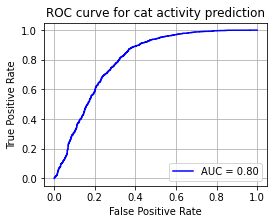

In [39]:
plt.figure(figsize=(4,3))
# Get the probabailties of the prediction
Y_prob = model_logi.predict_proba(X_test)[:,1]

fpr, tpr, threshold = roc_curve(y_test, Y_prob)
AUC = roc_auc_score(y_test, Y_prob)

plt.plot(fpr,tpr, 'b',label = 'AUC = %0.2f' % AUC)
plt.legend(loc = 'lower right')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve for cat activity prediction')
plt.grid()

In [ ]:
# explainer = shap.TreeExplainer(model)
# shap_values = explainer.shap_values(X)

In [ ]:
# shap.summary_plot(shap_values, features=X, feature_names=X.columns)

In [40]:
explainer = shap.Explainer(model_logi, X_train, feature_names=list(X_train.columns))
shap_values = explainer(X_test)

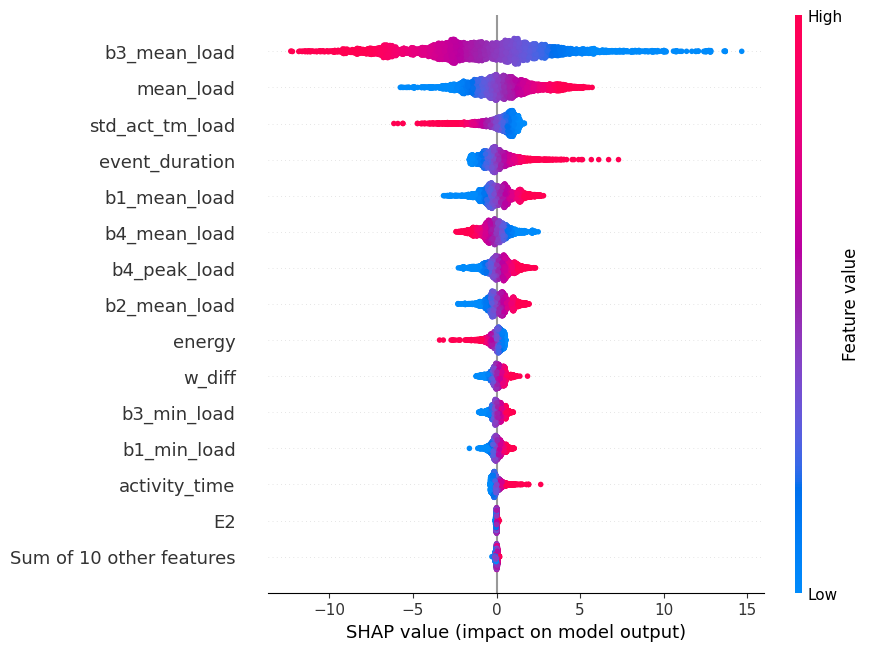

In [100]:
shap.plots.beeswarm(shap_values,max_display=15)

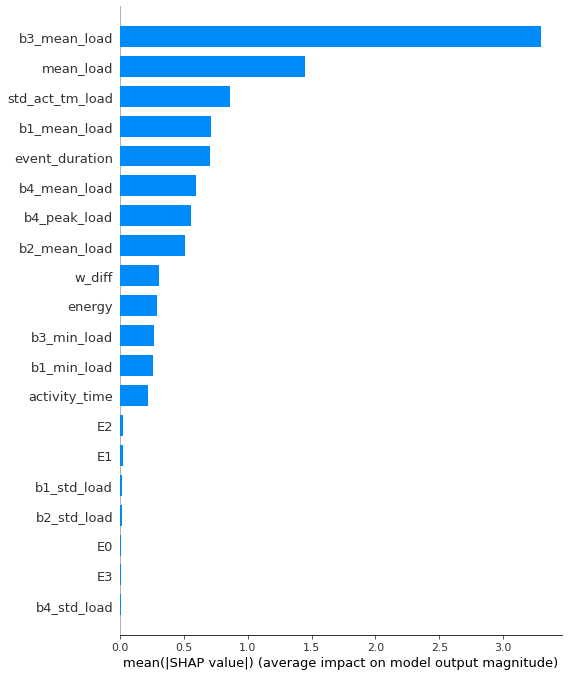

In [41]:
shap.summary_plot(shap_values, features=X_test, feature_names=list(X_train.columns), plot_type='bar')

#### Decision Tree

In [42]:
model_dt=DecisionTreeClassifier()
model_dt.fit(X_train,y_train)

y_train_pred= model_dt.predict(X_train)
y_test_pred=model_dt.predict(X_test)

    
print(confusion_matrix(y_test,y_test_pred))
print('Model report before tuning:')
print(classification_report(y_test, y_test_pred, labels=[0,1]))

print('-'*50)

avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(
        model_dt, X_train.values, y_train.values, X_test.values, y_test.values, 
        loss='0-1_loss',
        random_seed=123)

print('Average expected loss before tuning: %.3f' % avg_expected_loss)
print('Bias before tuning: %.3f' % avg_bias)
print('Variance before tuning: %.3f' % avg_var)
print('Sklearn 0-1 loss before tuning: %.3f' % zero_one_loss(y_test,y_test_pred))

print('-'*50)

### DT
param_grid = {'max_features': ['auto', 'sqrt', 'log2'],
              'ccp_alpha': [0.1, .01, .001],
              'max_depth' : [5, 6, 7, 8, 9],
              'criterion' :['gini', 'entropy']
             }
model_dt = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator=model_dt, param_grid=param_grid, cv=5, verbose=True)
grid_search.fit(X_train, y_train)

print("Tuned Hyperparameters :", grid_search.best_params_)
print("Accuracy :",grid_search.best_score_)

[[ 858  406]
 [ 451 2208]]
Model report before tuning:
              precision    recall  f1-score   support

           0       0.66      0.68      0.67      1264
           1       0.84      0.83      0.84      2659

    accuracy                           0.78      3923
   macro avg       0.75      0.75      0.75      3923
weighted avg       0.78      0.78      0.78      3923

--------------------------------------------------
Average expected loss before tuning: 0.219
Bias before tuning: 0.130
Variance before tuning: 0.160
Sklearn 0-1 loss before tuning: 0.218
--------------------------------------------------
Fitting 5 folds for each of 90 candidates, totalling 450 fits
Tuned Hyperparameters : {'ccp_alpha': 0.001, 'criterion': 'gini', 'max_depth': 7, 'max_features': 'sqrt'}
Accuracy : 0.8285633876796996


In [43]:
dt_ht = DecisionTreeClassifier(ccp_alpha=0.001, criterion='gini',
                       max_depth=7, max_features='sqrt')
dt_ht.fit(X_train, y_train)

y_train_predict_ht = dt_ht.predict(X_train)
y_test_predict_ht = dt_ht.predict(X_test)

print(confusion_matrix(y_test,y_test_predict_ht))
print('Model report after tuning:')
print(classification_report(y_test, y_test_predict_ht, labels=[0,1]))
print('-'*50)



def performance_dt_ht(X_train,y_train, X_test,y_test):
    
    print('Train accuracy_score',accuracy_score(y_train, y_train_predict_ht))
    print('Test accuracy_score',accuracy_score(y_test, y_test_predict_ht))
    print('-'*50)
    print('Train roc_auc_score:', roc_auc_score(y_train, y_train_predict_ht))
    print('Test roc_auc_score:', roc_auc_score(y_test, y_test_predict_ht))
    print('Cross Val Score:')
    scores = cross_val_score(dt_ht,X_train,y_train,cv=5)
    print('CV_scores:',scores)
    print('CV_scores:',scores.mean())
    print('-'*50)
    
performance_dt_ht(X_train,y_train, X_test,y_test)

avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(
        dt_ht, X_train.values, y_train.values, X_test.values, y_test.values, 
        loss='0-1_loss',
        random_seed=123)

print('Average expected loss after tuning: %.3f' % avg_expected_loss)
print('Average bias after tuning: %.3f' % avg_bias)
print('Average variance after tuning: %.3f' % avg_var)
print('Sklearn 0-1 loss after tuning: %.3f' % zero_one_loss(y_test,y_test_predict_ht))

[[ 757  507]
 [ 214 2445]]
Model report after tuning:
              precision    recall  f1-score   support

           0       0.78      0.60      0.68      1264
           1       0.83      0.92      0.87      2659

    accuracy                           0.82      3923
   macro avg       0.80      0.76      0.77      3923
weighted avg       0.81      0.82      0.81      3923

--------------------------------------------------
Train accuracy_score 0.8364291958041958
Test accuracy_score 0.8162120825898547
--------------------------------------------------
Train roc_auc_score: 0.7824910582072867
Test roc_auc_score: 0.7592055105421758
Cross Val Score:
CV_scores: [0.81212452 0.82031677 0.83169399 0.82896175 0.82240437]
CV_scores: 0.823100279640556
--------------------------------------------------
Average expected loss after tuning: 0.181
Average bias after tuning: 0.165
Average variance after tuning: 0.074
Sklearn 0-1 loss after tuning: 0.184


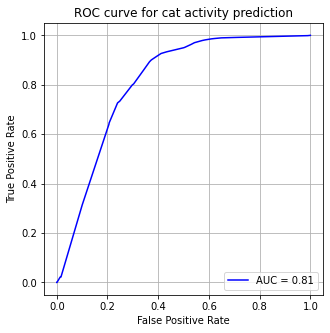

In [44]:
# Get the probabailties of the prediction
Y_prob = dt_ht.predict_proba(X_test)[:,1]

fpr, tpr, threshold = roc_curve(y_test, Y_prob)
AUC = roc_auc_score(y_test, Y_prob)

plt.figure(figsize=(5,5))
plt.plot(fpr,tpr, 'b',label = 'AUC = %0.2f' % AUC)
plt.legend(loc = 'lower right')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve for cat activity prediction')
plt.grid()


In [ ]:
### Model Interpretation Using SHAP

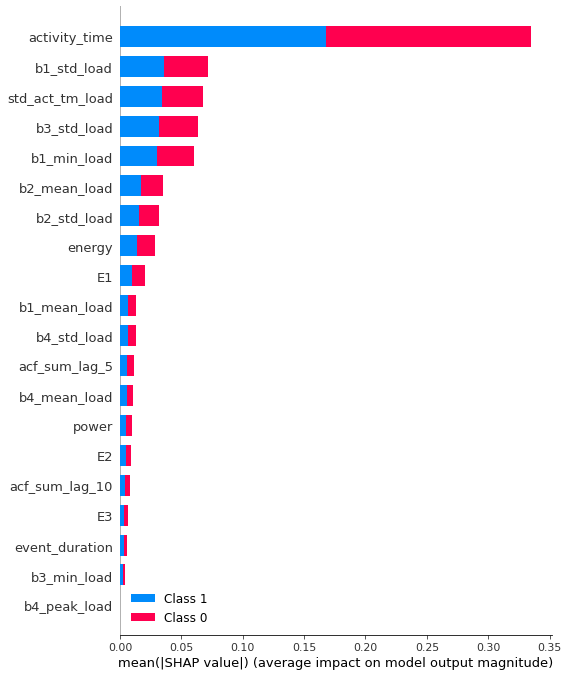

In [45]:
explainer = shap.TreeExplainer(dt_ht)
shap_values = explainer.shap_values(X_test)
# shap.plots.beeswarm(shap_values,max_display=20)
shap.summary_plot(shap_values,X_test)

#### Random Forest

In [46]:
model_rf=RandomForestClassifier()
model_rf.fit(X_train,y_train)

## prediction
y_train_pred= model_rf.predict(X_train)
y_test_pred=model_rf.predict(X_test)
    
print(confusion_matrix(y_test,y_test_pred))
print('Model report before tuning:')
print(classification_report(y_test, y_test_pred, labels=[0,1]))

print('-'*50)

avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(
        model_rf, X_train.values, y_train.values, X_test.values, y_test.values, 
        loss='0-1_loss',
        random_seed=123)

print('Average expected loss before tuning: %.3f' % avg_expected_loss)
print('Average bias before tuning: %.3f' % avg_bias)
print('Average variance before tuning: %.3f' % avg_var)
print('Sklearn 0-1 loss before tuning: %.3f' % zero_one_loss(y_test,y_test_pred))

print('-'*50)

### RF
param={'n_estimators'     : [10,15,20],
       'max_depth'        : [10, 20, 30, 40],
       'min_samples_leaf' : [1,2,3,4],
       'max_features'     : ['auto', 'sqrt', 'log2'],
       'bootstrap'        : [True, False]
      }

grid_search = GridSearchCV(estimator=model_rf, param_grid=param, cv=5, verbose=True)
grid_search.fit(X_train, y_train)

print("Tuned Hyperparameters :", grid_search.best_params_)
print("Accuracy :",grid_search.best_score_)

[[ 853  411]
 [ 108 2551]]
Model report before tuning:
              precision    recall  f1-score   support

           0       0.89      0.67      0.77      1264
           1       0.86      0.96      0.91      2659

    accuracy                           0.87      3923
   macro avg       0.87      0.82      0.84      3923
weighted avg       0.87      0.87      0.86      3923

--------------------------------------------------
Average expected loss before tuning: 0.137
Average bias before tuning: 0.133
Average variance before tuning: 0.026
Sklearn 0-1 loss before tuning: 0.132
--------------------------------------------------
Fitting 5 folds for each of 288 candidates, totalling 1440 fits
Tuned Hyperparameters : {'bootstrap': False, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'n_estimators': 20}
Accuracy : 0.8695372650138925


In [47]:
rf_ht=RandomForestClassifier(random_state=42, max_features='sqrt', n_estimators= 20, 
                             min_samples_leaf= 4, max_depth = 20, bootstrap = False)
rf_ht.fit(X_train, y_train)

y_train_predict_ht = rf_ht.predict(X_train)
y_test_predict_ht = rf_ht.predict(X_test)

print(confusion_matrix(y_test,y_test_predict_ht))
print('Model report after tuning:')
print(classification_report(y_test, y_test_predict_ht, labels=[0,1]))
print('-'*50)

def performance_rf_ht(X_train,y_train, X_test,y_test):
    
    print('Train accuracy_score',accuracy_score(y_train, y_train_predict_ht))
    print('Test accuracy_score',accuracy_score(y_test, y_test_predict_ht))
    print('-'*50)
    print('Train roc_auc_scor:', roc_auc_score(y_train, y_train_predict_ht))
    print('Test roc_auc_scor:', roc_auc_score(y_test, y_test_predict_ht))
    print('Cross Val Score of f1_score:')
    scores = cross_val_score(rf_ht,X_train,y_train,cv=5)
    print('CV_scores:',scores)
    print('Mean CV_scores:',scores.mean())
    print('-'*50)
    
performance_rf_ht(X_train,y_train, X_test,y_test)

avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(
        rf_ht, X_train.values, y_train.values, X_test.values, y_test.values, 
        loss='0-1_loss',
        random_seed=123)

print('Average expected loss after tuning: %.3f' % avg_expected_loss)
print('Average bias after tuning: %.3f' % avg_bias)
print('Average variance after tuning: %.3f' % avg_var)
print('Sklearn 0-1 loss after tuning: %.3f' % zero_one_loss(y_test,y_test_predict_ht))

[[ 858  406]
 [ 109 2550]]
Model report after tuning:
              precision    recall  f1-score   support

           0       0.89      0.68      0.77      1264
           1       0.86      0.96      0.91      2659

    accuracy                           0.87      3923
   macro avg       0.87      0.82      0.84      3923
weighted avg       0.87      0.87      0.86      3923

--------------------------------------------------
Train accuracy_score 0.9782561188811189
Test accuracy_score 0.8687229161356105
--------------------------------------------------
Train roc_auc_scor: 0.9688689085835015
Test roc_auc_scor: 0.818902306948934
Cross Val Score of f1_score:
CV_scores: [0.86837794 0.85909339 0.86994536 0.86721311 0.85901639]
Mean CV_scores: 0.8647292381063231
--------------------------------------------------
Average expected loss after tuning: 0.141
Average bias after tuning: 0.134
Average variance after tuning: 0.037
Sklearn 0-1 loss after tuning: 0.131


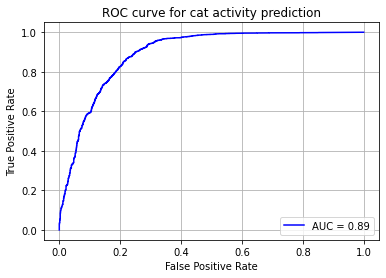

In [48]:
# Get the probabailties of the prediction
Y_prob = rf_ht.predict_proba(X_test)[:,1]

fpr, tpr, threshold = roc_curve(y_test, Y_prob)
AUC = roc_auc_score(y_test, Y_prob)

plt.plot(fpr,tpr, 'b',label = 'AUC = %0.2f' % AUC)
plt.legend(loc = 'lower right')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve for cat activity prediction')
plt.grid()

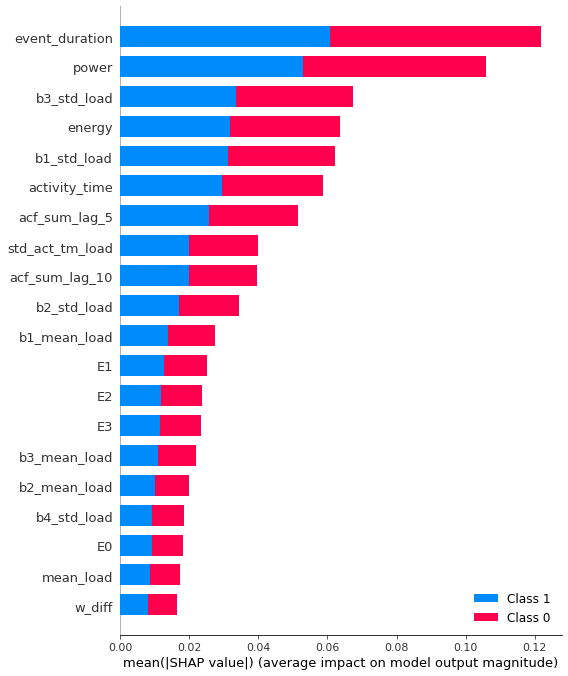

In [50]:
shap.summary_plot(shap_values, X_test)

In [ ]:
## Error Analysis 

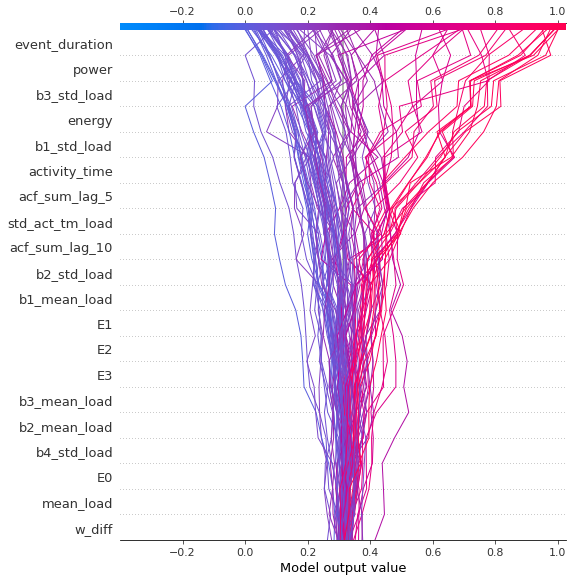

In [49]:
explainer = shap.TreeExplainer(rf_ht)
sample=X_test.sample(100)
shap_values=explainer.shap_values(sample)
shap.decision_plot(explainer.expected_value[0], shap_values[0], feature_names = list(X_test.columns))

### Model Comparison

In [51]:
ml_models = {
    'Logistic Regression': model_logi,   
    'Decision Tree': dt_ht,
    'Random Forest': rf_ht 
}

for model in ml_models:
    print(f"{model.upper():{30}} roc_auc_score: {roc_auc_score(y_test, ml_models[model].predict(X_test)):.3f}")
    

LOGISTIC REGRESSION            roc_auc_score: 0.718
DECISION TREE                  roc_auc_score: 0.750
RANDOM FOREST                  roc_auc_score: 0.816


In [52]:
scores_dict = {
    'Logistic Regression': {
        'Train': roc_auc_score(y_train, model_logi.predict(X_train)),
        'Test': roc_auc_score(y_test, model_logi.predict(X_test)),
    },
}

scores_dict['Decision Tree'] = {
        'Train': roc_auc_score(y_train, dt_ht.predict(X_train)),
        'Test': roc_auc_score(y_test, dt_ht.predict(X_test)),
    }



scores_dict['Random Forest'] = {
        'Train': roc_auc_score(y_train, rf_ht.predict(X_train)),
        'Test': roc_auc_score(y_test, rf_ht.predict(X_test)),
    }

In [53]:
import hvplot.pandas

In [54]:
scores_df = pd.DataFrame(scores_dict)
scores_df.hvplot.barh()

:Bars   [index,Variable]   (value)

#### Observations
- Implemented Logistic Regression, Decision Tree and Random Forest models
- Random Forest is giving best results
- Accuracy, precision, recall and F1 score of Random forest classifier is higher than other two models
- Random forest is showing low bias and low variance comparing with other two
- Feature importance in case of random forest is matching with initial f-test score values

### 5. Model_2: Train model to predict the urination and defecation:

## 5.1 Identifying Elimination events from previous data

In [55]:
final_df

,median_lc0,median_lc1,median_lc2,median_lc3,median_load,mean_load,std_load,event_duration,activity_time,mean_act_tm_load,median_act_tm_load,peak_act_tm_load,min_act_tm_load,std_act_tm_load,w_diff,acf_sum_lag_1,acf_sum_lag_5,acf_sum_lag_10,b1_mean_load,b1_peak_load,b1_min_load,b1_std_load,b2_mean_load,b2_peak_load,b2_min_load,b2_std_load,b3_mean_load,b3_peak_load,b3_min_load,b3_std_load,b4_mean_load,b4_peak_load,b4_min_load,b4_std_load,E0,E1,E2,E3,energy,power,Tags,Name_of_cat,Weight_of_cat,Target,Day_Part
0,2969.0,2430.0,4511.0,-1695.0,8214.0,10112.07,2961.45,151.97,44.77,14666.21,14791.0,16035.0,8382.0,643.39,6284.21,0.000190,0.000651,0.000652,14741.630,16035.0,12546.0,22.138202,14795.170,14945.0,14635.0,5.502727,14710.35,15621.0,13845.0,15.617618,12663.38,14760.0,8626.0,43.584745,36.415107,30.874747,36.942252,23.411322,4192.13,10.237187,urination,Ryan,6589.0,1.0,Noon
1,3038.0,2699.0,3622.0,-2523.0,6825.0,10049.85,3453.25,111.97,52.72,13695.47,13727.0,14962.0,7956.0,436.35,5739.47,0.000066,0.000364,0.000359,13595.830,14479.0,11025.0,22.300448,13733.870,14014.0,13362.0,6.073714,13826.28,14962.0,13092.0,15.336232,13204.76,14718.0,9496.0,34.978565,39.164397,20.808892,35.721562,45.775867,5338.32,11.552489,urination,Ryan,6935.0,1.0,Evening
2,1434.0,4082.0,2966.0,395.0,8875.0,11050.50,2572.06,102.37,45.57,13853.92,13905.0,15311.0,9409.0,825.20,4444.92,0.000047,0.000316,0.000316,13600.050,14970.0,9631.0,33.708901,13900.580,14826.0,13240.0,14.380542,14183.27,15311.0,12841.0,20.437466,12942.84,15269.0,9791.0,39.746950,24.318717,35.523654,27.414047,19.207811,2973.80,8.622065,urination,Ryan,5139.0,1.0,Night
3,2761.0,2589.0,2888.0,557.0,8795.0,9855.52,2384.83,66.37,11.82,14738.34,15417.0,16092.0,9332.0,1685.65,5406.34,0.000037,0.002361,0.002371,15657.030,16092.0,15112.0,13.493702,15387.640,15945.0,15122.0,12.373358,13768.72,15798.0,10858.0,44.265675,10219.05,11373.0,9511.0,26.110151,19.807827,16.618664,14.555411,16.021860,1137.09,5.331979,non_elimination,Ryan,6983.0,0.0,Evening
4,2046.0,2808.0,3277.5,272.5,11513.5,8927.67,3379.64,82.37,50.27,11582.99,11766.0,12523.0,5170.0,778.89,6412.99,0.000040,0.000563,0.000563,11618.930,12416.0,10939.0,14.960615,11765.010,12523.0,10687.0,14.839137,11773.36,12290.0,11481.0,7.289033,8378.44,11719.0,5321.0,42.038197,28.692856,28.642975,31.328741,26.195992,3311.42,9.098901,urination,Ryan,7017.0,1.0,Morning
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13070,3129.0,1656.0,3368.5,2852.0,11132.5,10371.32,1583.76,59.13,59.13,10374.98,11133.0,13033.0,6383.0,1579.43,3991.98,0.000125,0.000495,0.000496,10959.810,11802.0,9825.0,19.105497,11127.220,12140.0,10231.0,14.586980,9453.16,13033.0,6383.0,45.991630,7032.52,7034.0,7030.0,0.959166,26.247476,25.310670,35.775970,34.443577,3795.84,9.741663,urination,Sparkler,4116.0,1.0,Early Morning
13071,3579.0,394.0,2132.0,1732.5,7759.0,8288.57,1390.11,132.14,71.58,11595.55,12182.0,13016.0,8354.0,1137.48,3241.55,0.000095,0.000797,0.000799,12167.616,13047.0,10653.6,23.675388,12371.334,12959.4,11728.2,14.137539,11972.77,13016.0,8354.0,27.791545,9594.39,11821.0,8887.0,21.179235,25.345019,14.016776,19.874607,22.385040,1734.93,6.585590,non_elimination,Sparkler,4604.0,0.0,Morning
13072,4594.0,634.5,2130.5,1712.5,11898.0,10080.84,2186.40,137.82,77.89,11988.01,12015.0,12509.0,8124.0,300.91,3864.01,0.000051,0.000367,0.000367,12014.680,12471.0,11357.0,10.014989,12012.620,12509.0,11153.0,10.454664,12017.02,12462.0,11290.0,11.385078,11375.99,12269.0,8613.0,34.735141,45.988803,20.568179,40.826952,34.233317,5376.78,11.593964,urination,Sparkler,4416.0,1.0,Morning
13073,4874.0,819.0,2251.0,2637.0,10715.0,10486.63,976.95,205.38,195.09,10705.53,10717.0,11965.0,6715.0,219.45,3990.53,0.000085,0.000210,0.000210,10712.340,11965.0,9665.0,11.430223,10718.280,11340.0,9587.0,9.722654,10717.35,11384.0,10095.0,12.429803,10466.96,11423.0,7047.0,28.900865,71.901878,29.

In [56]:
model_fd=final_df.drop(['Name_of_cat'],axis=1)

In [57]:
model_fd['Day_Part'].replace({'Late Night':1,'Early Morning':2,'Morning':3,'Noon':4,'Evening':5,'Night':6},inplace=True)

In [58]:
model_fd=model_fd[model_fd['Target']==1]

In [59]:
model_fd.drop('Target',axis=1,inplace=True)

In [60]:
## Converting categorical values of Tags column into numerical values such as 0 refers to urination, 1 for defecation and 2 for non elimination. 
model_fd['Tags']=model_fd['Tags'].map({'urination':0,'defecation':1})

In [61]:
X=model_fd.drop('Tags',axis=1)
y=model_fd['Tags']

## 5.2 & 5.3: Feature Selection & Model Building(LR, DT and RF)
- Model Performance using Evaluation Matrix
- Cross validation score, Bias and Variance comparison
- Hyperparameter Tuning

In [62]:
result=fcl(X,y)
f_score=result[0]
p_value=result[1]
f_scores=pd.DataFrame(result[0],columns=["f_Score"])
p_values=pd.DataFrame(result[1],columns=["p_value"])
df_columns=pd.DataFrame(X.columns)
features_rank=pd.concat([df_columns,f_scores,p_values],axis=1)
features_rank['p1']=features_rank['p_value'].round(4)
features_rank.sort_values(by=['f_Score'],ascending=False)

,0,f_Score,p_value,p1
39,power,2636.472904,0.000000e+00,0.0000
8,activity_time,2498.884679,0.000000e+00,0.0000
38,energy,2316.662815,0.000000e+00,0.0000
7,event_duration,2182.252767,0.000000e+00,0.0000
35,E1,1635.651684,0.000000e+00,0.0000
37,E3,1548.846233,1.609558e-312,0.0000
36,E2,1451.247407,2.305458e-294,0.0000
34,E0,1385.762300,4.377559e-282,0.0000
4,median_load,325.705620,1.534130e-71,0.0000
1,median_lc1,84.489507,4.733800e-20,0.0000


- features_removed= 'b3_mean_load','median_act_tm_load','peak_act_tm_load','b2_mean_load','Weight_of_cat','mean_act_tm_load','b4_min_load','b4_std_load','min_act_tm_load','b2_min_load','b3_min_load','b1_mean_load'
- These features have p>0.05 and does not showing strong correlation with Tag

In [158]:
model_fd['Tags'].value_counts()

0    6611
1    2316
Name: Tags, dtype: int64

<AxesSubplot: >

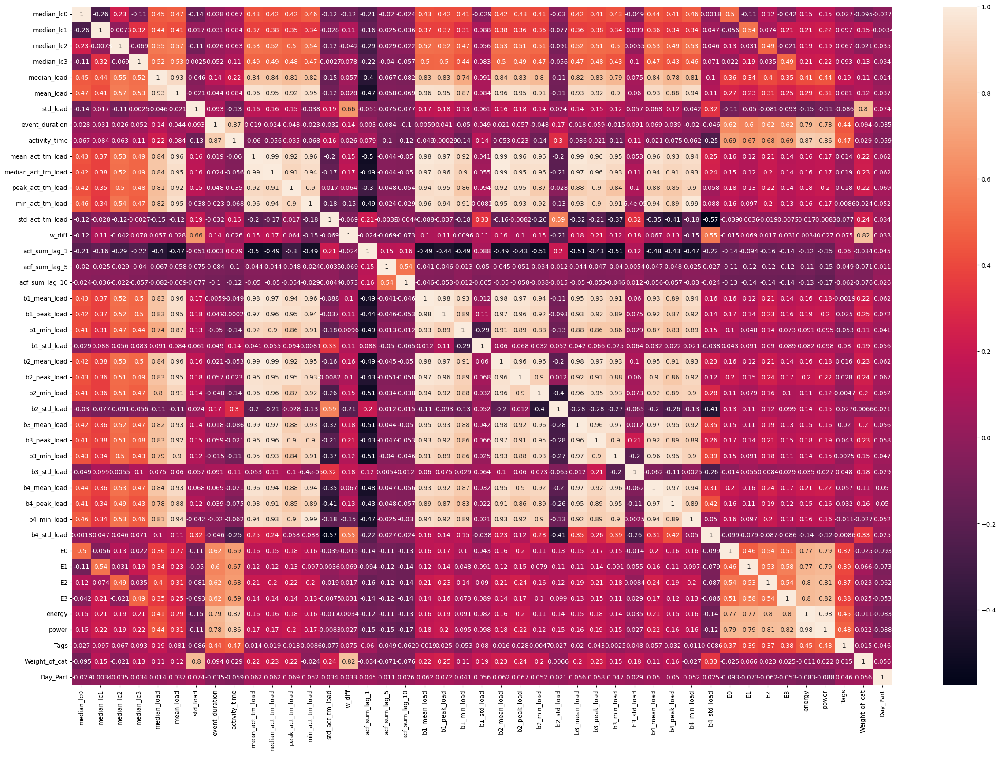

In [160]:
plt.figure(figsize=(30,20))
sns.heatmap(data=model_fd.corr(),annot=True)

### Observations:
- Activity time, event duration , Energy and Power are showing strong correlation with tags

In [ ]:
### 5.3 Feature selection

In [63]:
features=['activity_time','event_duration','power','energy',
          'E0','E1','E2','E3','median_load','std_load','acf_sum_lag_1',
          'acf_sum_lag_10','b1_std_load','median_lc1','median_lc2','median_lc3',
          'std_act_tm_load','Day_Part','Tags']

In [64]:
model_fd=model_fd[features]

### Logistic Regession

In [65]:
X=model_fd.drop('Tags',axis=1)
y=model_fd['Tags']

In [66]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=101)

In [67]:
model_logi_2 = LogisticRegression(random_state=101, penalty="l2", C=5)
model_logi_2.fit(X_train,y_train)
## prediction
y_train_pred= model_logi_2.predict(X_train)
y_test_pred=model_logi_2.predict(X_test)

    
print(confusion_matrix(y_test,y_test_pred))
print('-'*50)

print(classification_report(y_test, y_test_pred))
print('-'*50)

def performance(X_train,y_train, X_test,y_test):
    
    print('Train accuracy_score',accuracy_score(y_train,y_train_pred))
    print('Test accuracy_score',accuracy_score(y_test,y_test_pred))
    print('-'*50)
    print('Train roc_auc_score:', roc_auc_score(y_train,y_train_pred))
    print('Test roc_auc_score:', roc_auc_score(y_test,y_test_pred))
    print('Cross Val Score:')
    scores = cross_val_score(model_logi_2,X_train,y_train,cv=5,scoring='f1')
    print('CV_scores:',scores)
    print('Mean CV_scores:',scores.mean())
    print('-'*50)
    
    
print('-'*50)   
performance(X_train,y_train, X_test,y_test)

avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(
        model_logi_2, X_train.values, y_train.values, X_test.values, y_test.values, 
        loss='0-1_loss',
        random_seed=123)

print('Average expected loss: %.3f' % avg_expected_loss)
print('Average bias: %.3f' % avg_bias)
print('Average variance: %.3f' % avg_var)
print('Sklearn 0-1 loss: %.3f' % zero_one_loss(y_test,y_test_pred))

[[1568  104]
 [ 339  221]]
--------------------------------------------------
              precision    recall  f1-score   support

           0       0.82      0.94      0.88      1672
           1       0.68      0.39      0.50       560

    accuracy                           0.80      2232
   macro avg       0.75      0.67      0.69      2232
weighted avg       0.79      0.80      0.78      2232

--------------------------------------------------
--------------------------------------------------
Train accuracy_score 0.7982076176250934
Test accuracy_score 0.8015232974910395
--------------------------------------------------
Train roc_auc_score: 0.6733058461291538
Test roc_auc_score: 0.666220950102529
Cross Val Score:
CV_scores: [0.49077491 0.5087108  0.51094891 0.53068592 0.53054101]
Mean CV_scores: 0.5143323094092634
--------------------------------------------------
Average expected loss: 0.199
Average bias: 0.198
Average variance: 0.011
Sklearn 0-1 loss: 0.198


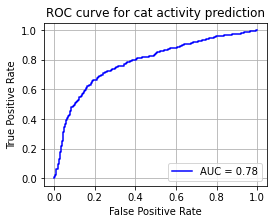

In [68]:
plt.figure(figsize=(4,3))
# Get the probabailties of the prediction
Y_prob = model_logi_2.predict_proba(X_test)[:,1]


fpr, tpr, threshold = roc_curve(y_test, Y_prob)
AUC = roc_auc_score(y_test, Y_prob)

plt.plot(fpr,tpr, 'b',label = 'AUC = %0.2f' % AUC)
plt.legend(loc = 'lower right')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve for cat activity prediction')
plt.grid()

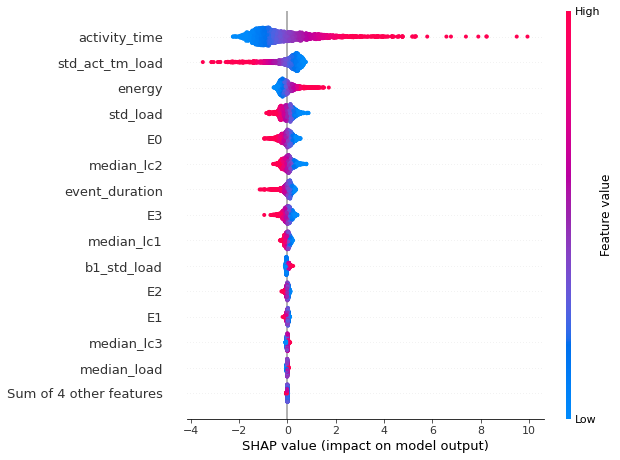

In [69]:
explainer = shap.Explainer(model_logi_2, X_test, feature_names=list(X_test.columns))
shap_values = explainer(X_test)
shap.plots.beeswarm(shap_values,max_display=15)

### Decision Tree

In [71]:
model_dt_2=DecisionTreeClassifier()
model_dt_2.fit(X_train,y_train)

y_train_pred= model_dt_2.predict(X_train)
y_test_pred=model_dt_2.predict(X_test)

    
print(confusion_matrix(y_test,y_test_pred))
print('Model report before tuning:')
print(classification_report(y_test, y_test_pred, labels=[0,1]))

print('-'*50)

avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(
        model_dt_2, X_train.values, y_train.values, X_test.values, y_test.values, 
        loss='0-1_loss',
        random_seed=123)

print('Average expected loss before tuning: %.3f' % avg_expected_loss)
print('Bias before tuning: %.3f' % avg_bias)
print('Variance before tuning: %.3f' % avg_var)
print('Sklearn 0-1 loss before tuning: %.3f' % zero_one_loss(y_test,y_test_pred))

print('-'*50)

### DT
param_grid = {'max_features': ['auto', 'sqrt', 'log2'],
              'ccp_alpha': [0.1, .01, .001],
              'max_depth' : [5, 6, 7, 8, 9],
              'criterion' :['gini', 'entropy']
             }

grid_search = GridSearchCV(estimator=model_dt_2, param_grid=param_grid, cv=5, verbose=True)
grid_search.fit(X_train, y_train)

print("Tuned Hyperparameters :", grid_search.best_params_)
print("Accuracy :",grid_search.best_score_)

[[1430  242]
 [ 209  351]]
Model report before tuning:
              precision    recall  f1-score   support

           0       0.87      0.86      0.86      1672
           1       0.59      0.63      0.61       560

    accuracy                           0.80      2232
   macro avg       0.73      0.74      0.74      2232
weighted avg       0.80      0.80      0.80      2232

--------------------------------------------------
Average expected loss before tuning: 0.220
Bias before tuning: 0.146
Variance before tuning: 0.169
Sklearn 0-1 loss before tuning: 0.202
--------------------------------------------------
Fitting 5 folds for each of 90 candidates, totalling 450 fits
Tuned Hyperparameters : {'ccp_alpha': 0.001, 'criterion': 'entropy', 'max_depth': 9, 'max_features': 'log2'}
Accuracy : 0.8100074682598954


In [72]:
dt_ht_2 = DecisionTreeClassifier(ccp_alpha=0.001, criterion='entropy',
                       max_depth=9, max_features='log2')
dt_ht_2.fit(X_train, y_train)

y_train_predict_ht = dt_ht_2.predict(X_train)
y_test_predict_ht = dt_ht_2.predict(X_test)

print(confusion_matrix(y_test,y_test_predict_ht))
print('Model report after tuning:')
print(classification_report(y_test, y_test_predict_ht, labels=[0,1]))
print('-'*50)



def performance_dt_ht(X_train,y_train, X_test,y_test):
    
    print('Train accuracy_score',accuracy_score(y_train, y_train_predict_ht))
    print('Test accuracy_score',accuracy_score(y_test, y_test_predict_ht))
    print('-'*50)
    print('Train roc_auc_score:', roc_auc_score(y_train, y_train_predict_ht))
    print('Test roc_auc_score:', roc_auc_score(y_test, y_test_predict_ht))
    print('Cross Val Score:')
    scores = cross_val_score(dt_ht_2,X_train,y_train,cv=5)
    print('CV_scores:',scores)
    print('Mean CV_scores:',scores.mean())
    print('-'*50)
    
performance_dt_ht(X_train,y_train, X_test,y_test)

avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(
        dt_ht_2, X_train.values, y_train.values, X_test.values, y_test.values, 
        loss='0-1_loss',
        random_seed=123)

print('Average expected loss after tuning: %.3f' % avg_expected_loss)
print('Bias after tuning: %.3f' % avg_bias)
print('Variance after tuning: %.3f' % avg_var)
print('Sklearn 0-1 loss after tuning: %.3f' % zero_one_loss(y_test,y_test_predict_ht))

[[1469  203]
 [ 242  318]]
Model report after tuning:
              precision    recall  f1-score   support

           0       0.86      0.88      0.87      1672
           1       0.61      0.57      0.59       560

    accuracy                           0.80      2232
   macro avg       0.73      0.72      0.73      2232
weighted avg       0.80      0.80      0.80      2232

--------------------------------------------------
Train accuracy_score 0.8473487677371172
Test accuracy_score 0.8006272401433692
--------------------------------------------------
Train roc_auc_score: 0.7906565451584502
Test roc_auc_score: 0.7232228298017772
Cross Val Score:
CV_scores: [0.80955937 0.79238237 0.78864824 0.82374907 0.80731889]
Mean CV_scores: 0.8043315907393577
--------------------------------------------------
Average expected loss after tuning: 0.203
Bias after tuning: 0.156
Variance after tuning: 0.133
Sklearn 0-1 loss after tuning: 0.199


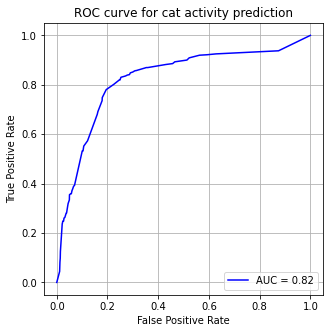

In [73]:
# Get the probabailties of the prediction
Y_prob = dt_ht_2.predict_proba(X_test)[:,1]

fpr, tpr, threshold = roc_curve(y_test, Y_prob)
AUC = roc_auc_score(y_test, Y_prob)

plt.figure(figsize=(5,5))
plt.plot(fpr,tpr, 'b',label = 'AUC = %0.2f' % AUC)
plt.legend(loc = 'lower right')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve for cat activity prediction')
plt.grid()


In [ ]:
explainer = shap.TreeExplainer(dt_ht)
shap_values = explainer.shap_values(X_test)
# shap.plots.beeswarm(shap_values,max_display=20)
shap.summary_plot(shap_values,X_test)

### Random Forest

In [174]:
model_rf_2=RandomForestClassifier()
model_rf_2.fit(X_train,y_train)

## prediction
y_train_pred= model_rf_2.predict(X_train)
y_test_pred=model_rf_2.predict(X_test)
    
print(confusion_matrix(y_test,y_test_pred))
print('Model report before tuning:')
print(classification_report(y_test, y_test_pred, labels=[0,1]))

print('-'*50)

avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(
        model_rf_2, X_train.values, y_train.values, X_test.values, y_test.values, 
        loss='0-1_loss',
        random_seed=123)

print('Average expected loss before tuning: %.3f' % avg_expected_loss)
print('Average bias before tuning: %.3f' % avg_bias)
print('Average variance before tuning: %.3f' % avg_var)
print('Sklearn 0-1 loss before tuning: %.3f' % zero_one_loss(y_test,y_test_pred))

print('-'*50)

### RF
param={'n_estimators'     : [10,15,20],
       'max_depth'        : [10, 20, 30, 40],
       'min_samples_leaf' : [1,2,3,4],
       'max_features'     : ['auto', 'sqrt', 'log2'],
       'bootstrap'        : [True, False]
      }

grid_search = GridSearchCV(estimator=model_rf_2, param_grid=param, cv=5, verbose=True)
grid_search.fit(X_train, y_train)

print("Tuned Hyperparameters :", grid_search.best_params_)
print("Accuracy :",grid_search.best_score_)

[[1552  120]
 [ 202  358]]
Model report before tuning:
              precision    recall  f1-score   support

           0       0.88      0.93      0.91      1672
           1       0.75      0.64      0.69       560

    accuracy                           0.86      2232
   macro avg       0.82      0.78      0.80      2232
weighted avg       0.85      0.86      0.85      2232

--------------------------------------------------
Average expected loss before tuning: 0.155
Average bias before tuning: 0.148
Average variance before tuning: 0.044
Sklearn 0-1 loss before tuning: 0.144
--------------------------------------------------
Fitting 5 folds for each of 288 candidates, totalling 1440 fits
Tuned Hyperparameters : {'bootstrap': False, 'max_depth': 30, 'max_features': 'auto', 'min_samples_leaf': 4, 'n_estimators': 15}
Accuracy : 0.8412247946228529


In [176]:
rf_ht_2=RandomForestClassifier(random_state=42, max_features='auto', n_estimators= 15, min_samples_leaf= 4, max_depth= 30,bootstrap= False)
rf_ht_2.fit(X_train, y_train)

y_train_predict_ht = rf_ht_2.predict(X_train)
y_test_predict_ht = rf_ht_2.predict(X_test)

confusion_matrix(y_test,y_test_predict_ht)
print('Model report after tuning:')
print(classification_report(y_test, y_test_predict_ht, labels=[0,1]))
print('-'*50)

def performance_rf_ht(X_train,y_train, X_test,y_test):
    
    print('Train accuracy_score',accuracy_score(y_train, y_train_predict_ht))
    print('Test accuracy_score',accuracy_score(y_test, y_test_predict_ht))
    print('-'*50)
    print('Train f1_score:', f1_score(y_train, y_train_predict_ht))
    print('Test f1_score:', f1_score(y_test, y_test_predict_ht))
    print('Cross Val Score of f1_score:')
    scores = cross_val_score(rf_ht_2,X_train,y_train,cv=5)
    print('CV_scores:',scores)
    print('Mean CV_scores:',scores.mean())
    print('-'*50)
    
    
performance_rf_ht(X_train,y_train, X_test,y_test)

avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(
        rf_ht_2, X_train.values, y_train.values, X_test.values, y_test.values, 
        loss='0-1_loss',
        random_seed=123)

print('Average expected loss after tuning: %.3f' % avg_expected_loss)
print('Bias after tuning: %.3f' % avg_bias)
print('Variance after tuning: %.3f' % avg_var)
print('Sklearn 0-1 loss after tuning: %.3f' % zero_one_loss(y_test,y_test_predict_ht))

Model report after tuning:
              precision    recall  f1-score   support

           0       0.88      0.93      0.90      1672
           1       0.74      0.61      0.67       560

    accuracy                           0.85      2232
   macro avg       0.81      0.77      0.79      2232
weighted avg       0.84      0.85      0.84      2232

--------------------------------------------------
Train accuracy_score 0.9899925317401046
Test accuracy_score 0.8485663082437276
--------------------------------------------------
Train f1_score: 0.9806414331118173
Test f1_score: 0.6692759295499022
Cross Val Score of f1_score:
CV_scores: [0.83868559 0.82897685 0.82897685 0.85212845 0.8334578 ]
Mean CV_scores: 0.8364451082897686
--------------------------------------------------
Average expected loss after tuning: 0.163
Bias after tuning: 0.150
Variance after tuning: 0.067
Sklearn 0-1 loss after tuning: 0.151


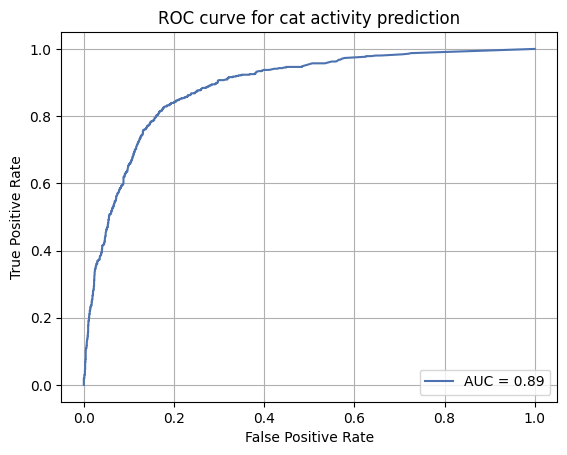

In [177]:
# Get the probabailties of the prediction
Y_prob = rf_ht_2.predict_proba(X_test)[:,1]

fpr, tpr, threshold = roc_curve(y_test, Y_prob)
AUC = roc_auc_score(y_test, Y_prob)

plt.plot(fpr,tpr, 'b',label = 'AUC = %0.2f' % AUC)
plt.legend(loc = 'lower right')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve for cat activity prediction')
plt.grid()

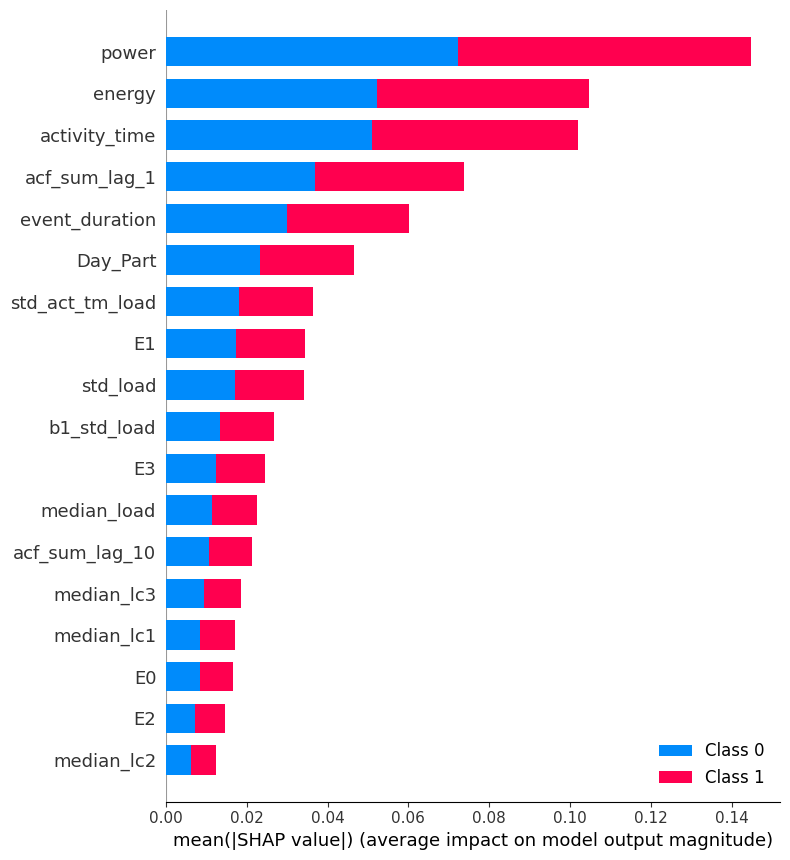

In [178]:
explainer = shap.TreeExplainer(rf_ht_2)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

## 5.4 Error Analysis

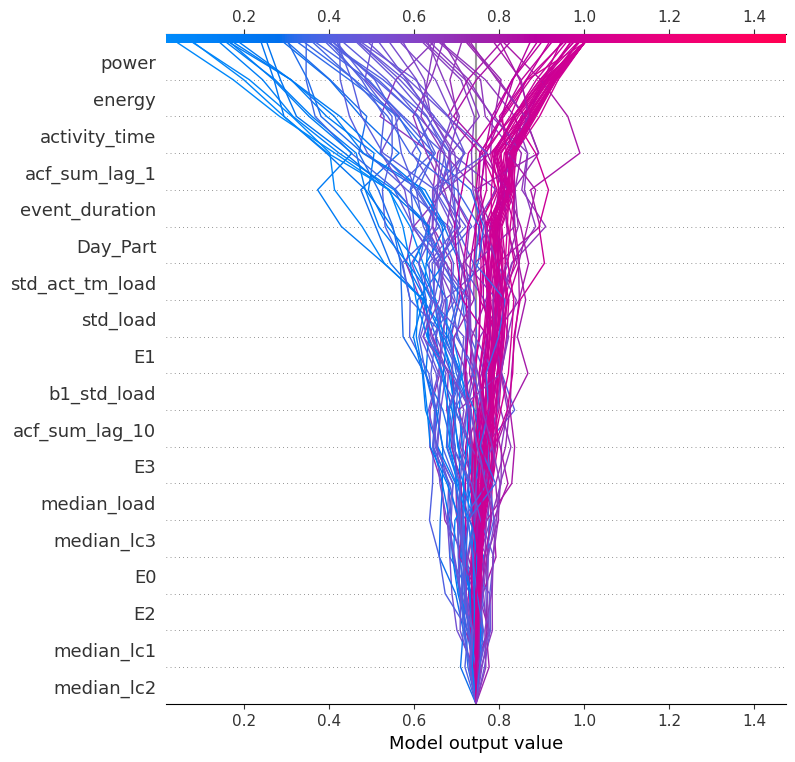

In [188]:
explainer = shap.TreeExplainer(rf_ht_2)
sample=X_test.sample(100)
shap_values=explainer.shap_values(sample)
shap.decision_plot(explainer.expected_value[0], shap_values[0], feature_names = list(X_test.columns))

In [ ]:
Taken 100 samples out of 2200

In [ ]:
## Model Comparison

In [3]:
ml_models = {
    'Logistic Regression': model_logi_2,   
    'Decision Tree': dt_ht_2,
    'Random Forest': rf_ht_2, 
}

for model in ml_models:
    print(f"{model.upper():{30}} roc_auc_score: {roc_auc_score(y_test, ml_models[model].predict(X_test)):.3f}")

NameError: name 'model_logi' is not defined

In [ ]:
scores_dict = {
    'Logistic Regression': {
        'Train': roc_auc_score(y_train, model_logi_2.predict(X_train)),
        'Test': roc_auc_score(y_test, model_logi_2.predict(X_test)),
    },
}

scores_dict['Decision Tree'] = {
        'Train': roc_auc_score(y_train, dt_ht_2.predict(X_train)),
        'Test': roc_auc_score(y_test, dt_ht_2.predict(X_test)),
    }



scores_dict['Random Forest'] = {
        'Train': roc_auc_score(y_train, rf_ht_2.predict(X_train)),
        'Test': roc_auc_score(y_test, rf_ht_2.predict(X_test)),
    }

In [ ]:
scores_df = pd.DataFrame(scores_dict)
scores_df.hvplot.barh()

#### Observations
- Implemented Logistic Regression, Decision Tree and Random Forest models
- Random Forest is giving best results
- Accuracy, precision, recall and F1 score of Random forest classifier is higher than other two models
- Random forest is showing low bias and low variance comparing with other two
- Feature importance in case of random forest is matching with initial f-test score values